In [ ]:
import os
import re
import logging
from google.colab import drive
import pandas as pd
import numpy as np
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
import statsmodels.formula.api as smf
from statsmodels.iolib.summary2 import summary_col

# --- Configuração de Logging ---
logging.basicConfig(level=logging.INFO, format='%(levelname)s: %(message)s')

# --- Configuração de Caminhos no Google Drive ---
try:
    drive.mount('/content/drive')
except Exception as e:
    logging.warning(f"Google Drive já montado ou erro ao montar: {e}. Continuando sem tentar forçar remount.")

base_corpus_path = '/content/drive/MyDrive/corpus'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# --- Listas de Expressões Temporais por Idioma (GLOBAL) ---
temporal_expressions_pt = [
    # Dêiticos de Ponto no Tempo (Português)
    'agora', 'hoje', 'ontem', 'amanhã', 'logo', 'já',
    'cedo', 'tarde', 'noite', 'dia', 'manhã', 'meio-dia',
    'meia-noite', 'nesta hora', 'nesse momento', 'neste instante',
    'neste minuto', 'nesta semana', 'neste mês', 'neste ano',
    'passado', 'presente', 'futuro',

    # Dêiticos de Período/Duração (Português)
    'daqui a pouco', 'semana passada', 'mês que vem', 'ano que vem',
    'no dia seguinte', 'no outro dia', 'dia desses', 'depois de amanhã',
    'há pouco', 'há muito tempo', 'durante o dia', 'em breve',
    'um tempo', 'um dia', 'muito tempo',

    # Advérbios de Frequência (Português)
    'sempre', 'nunca', 'às vezes', 'quase sempre', 'quase nunca',
    'frequentemente', 'raramente', 'ocasionalmente', 'diariamente',
    'semanalmente', 'mensalmente', 'anualmente', 'todo dia', 'toda hora',
    'de vez em quando',

    # Dêiticos de Relação Temporal (Português)
    'antes', 'depois', 'primeiro', 'último', 'enquanto', 'depois que', 'antes que'
]

temporal_expressions_en = [
    # Deictics of Point in Time (English)
    'now', 'today', 'yesterday', 'tomorrow', 'soon', 'already',
    'early', 'late', 'night', 'day', 'morning', 'noon',
    'midnight', 'this hour', 'this moment', 'this instant',
    'this minute', 'this week', 'this month', 'this year',
    'past', 'present', 'future',

    # Deictics of Period/Duration (English)
    'in a while', 'later on', 'last week', 'next month', 'next year',
    'the next day', 'the other day', 'day after tomorrow',
    'a while ago', 'long ago', 'during the day', 'shortly',
    'a time', 'one day', 'a long time', 'some time',

    # Adverbs of Frequency (English)
    'always', 'never', 'sometimes', 'almost always', 'hardly ever',
    'frequently', 'rarely', 'occasionally', 'daily',
    'weekly', 'monthly', 'annually', 'every day', 'every hour',
    'once in a while', 'from time to time',

    # Deictics of Temporal Relation (English)
    'before', 'after', 'first', 'last', 'while', 'after that', 'before that'
]

In [ ]:
# Nomes dos diretórios de saída (globalmente, mas prefixados pelo nome do corpus)
output_cds_base_dir_template = os.path.join(base_corpus_path, '{corpus_name}CDS')
output_chi_base_dir_template = os.path.join(base_corpus_path, '{corpus_name}CHI')
stats_output_base_dir_template = os.path.join(base_corpus_path, '{corpus_name}Stats')

logging.info(f"Diretório base do corpus: {base_corpus_path}\n")

In [ ]:
def get_speaker_codes(file_path: str) -> tuple[str, list[str]]:
    """
    Lê o cabeçalho do arquivo .cha para identificar o código do falante
    da "Target_Child" e todos os outros falantes.
    Retorna (child_code, other_speakers_codes) como (str, list[str]).
    Aprimorado para ser mais flexível com o formato da sigla do falante.
    """
    child_code = 'CHI' # Default
    all_speakers_raw = {} # Dict to store code:role from @Participants and @ID

    try:
        with open(file_path, 'r', encoding='utf-8') as f:
            lines = f.readlines()

            for line in lines:
                if line.startswith('@Participants:'):
                    participants_info = line.strip().split(':')[1].strip()
                    # Buscar siglas de 1 ou mais caracteres alfanuméricos
                    matches = re.findall(r'([A-Z0-9]+)\s+([^,]+)', participants_info)
                    for code, role_part in matches:
                        role_part = role_part.strip()
                        all_speakers_raw[code] = role_part
                        if 'Target_Child' in role_part:
                            child_code = code
                    break

            if child_code == 'CHI' and not any('Target_Child' in line for line in lines if line.startswith('@Participants:')):
                for line in lines:
                    if line.startswith('@ID:'):
                        parts = line.strip().split('|')
                        if len(parts) >= 8:
                            code_from_id = parts[2]
                            role_from_id = parts[7]
                            if code_from_id not in all_speakers_raw or 'Target_Child' in role_from_id:
                               all_speakers_raw[code_from_id] = role_from_id

                            if 'Target_Child' in role_from_id:
                                child_code = code_from_id
                        elif len(parts) > 2:
                            all_speakers_raw[parts[2]] = all_speakers_raw.get(parts[2], 'Unknown')

    except Exception as e:
        logging.error(f"Erro ao ler cabeçalho de {os.path.basename(file_path)}: {e}")

    all_speaker_codes = list(all_speakers_raw.keys())
    other_speakers_codes = [code for code in all_speaker_codes if code != child_code]

    logging.debug(f"  Falante da Criança (CHI): {child_code}")
    logging.debug(f"  Outros Falantes (CDS): {other_speakers_codes}")

    return child_code, other_speakers_codes

def parse_age_from_filename(filename: str) -> tuple[float, int]:
    """
    Extrai a idade (anos, meses, dias) do nome do arquivo (YYMMDD).
    Retorna a idade em meses (aproximado) e em dias.
    Suposição: 1 ano = 365.25 dias; 1 mês = 30.4375 dias (365.25/12).
    """
    match = re.match(r'(\d{2})(\d{2})(\d{2})\.cha', filename)
    if match:
        years = int(match.group(1))
        months = int(match.group(2))
        days = int(match.group(3))

        days_in_year = 365.25
        days_in_month = days_in_year / 12

        total_months = years * 12 + months + days / days_in_month
        total_days = years * days_in_year + months * days_in_month + days
        return total_months, int(total_days)
    return None, None

def clean_chat_line_for_output_and_analysis(line_content: str, keep_punctuation: bool = True) -> str:
    """
    Limpa uma linha de texto (segmento de enunciado) do formato CHAT.
    - Se keep_punctuation é True, formata a pontuação (ex: "palavra !").
    - Se keep_punctuation é False, remove a pontuação para contagem de palavras e busca.
    Recebe o conteúdo da linha *já sem* o prefixo do falante e *já sem* marcadores de tempo.
    """
    line = line_content

    # Remove anotações CHAT internas e remanescentes
    line = re.sub(r'•\S*?•?', '', line) # Remove bullets (•) and associated data (e.g. •33647_36507• or just •)
    line = re.sub(r'\[.*?\]', '', line)    # Remove bracketed annotations (e.g., [=! singing], [///], [?] etc.)
    line = re.sub(r'\([^\)]*\)', '', line) # Remove parenthesized annotations (e.g., (es), (..) )
    line = re.sub(r'\b(xxx|yyy|www|0)\b', '', line, flags=re.IGNORECASE) # Remove unintelligible/empty markers
    line = re.sub(r'\+\S*', '', line)      # Remove interruption markers (e.g., +//., + ...)
    line = re.sub(r'[‡„]', '', line)       # Remove interaction markers (e.g., ‡, „)
    line = re.sub(r'(?:@|&)[a-z]+', '', line) # Remove special tags (e.g. @c, &Fem, @i, @o)
    line = re.sub(r'[:^]', '', line)       # Remove syllable duration/pause markers (ex: na:o, a^go^ra)

    if keep_punctuation:
        # Adiciona um espaço simples antes da pontuação se não houver ou se houver múltiplos espaços
        line = re.sub(r'\s*([.,?!])', r' \1', line)
    else:
        # Remove pontuação para contagem de palavras e busca de expressões
        line = re.sub(r'[.,?!]', '', line)

    line = re.sub(r'\s+', ' ', line).strip() # Normaliza múltiplos espaços e remove espaços iniciais/finais

    return line

def process_single_file(file_path: str, child_name: str,
                        output_cds_path: str, output_chi_path: str,
                        compiled_temporal_regex: dict) -> dict:
    """
    Processa um único arquivo .cha, extrai dados de frequência e contextos de fala.
    Adaptação para lidar com múltiplos enunciados por linha no formato CHAT (como no Weist).
    Retorna um dicionário com os dados da sessão.
    """
    filename = os.path.basename(file_path)
    child_age_months, child_age_days = parse_age_from_filename(filename)
    if child_age_months is None:
        logging.warning(f"    Aviso: Não foi possível extrair a idade de {filename}. Pulando arquivo.")
        return None

    child_code, cds_speaker_codes = get_speaker_codes(file_path)
    child_prefix = f"*{child_code}:"
    cds_prefixes = [f"*{code}:" for code in cds_speaker_codes]

    # Contadores e listas para este arquivo (redefinidos para somar segmentos)
    file_chi_total_words = 0
    file_cds_total_words = 0
    file_chi_deictic_count = 0
    file_cds_deictic_count = 0

    cleaned_chi_lines_output = [] # Armazena enunciados limpos para o arquivo de saída CHI.txt
    cleaned_cds_lines_output = [] # Armazena enunciados limpos para o arquivo de saída CDS.txt

    current_file_deictic_contexts = {'CHI': [], 'CDS': []} # Contextos de dêiticos (dicionário para uso qualitativo)

    try:
        with open(file_path, 'r', encoding='utf-8') as f_in:
            for raw_line in f_in: # Leitura da linha bruta do arquivo .cha
                speaker_type = None
                current_speaker_code_str = None
                current_line_prefix = None

                # Identifica o falante da linha
                if raw_line.startswith(child_prefix):
                    speaker_type = 'CHI'
                    current_speaker_code_str = child_code
                    current_line_prefix = child_prefix
                else:
                    for prefix in cds_prefixes:
                        if raw_line.startswith(prefix):
                            speaker_type = 'CDS'
                            current_speaker_code_str = prefix.strip(':*')
                            current_line_prefix = prefix
                            break

                if speaker_type and current_line_prefix is not None:
                    # Extrai o conteúdo da fala (removendo o prefixo do falante)
                    line_content_raw = raw_line[len(current_line_prefix):].strip()

                    # PASSO CRUCIAL: Dividir a linha em múltiplos enunciados usando marcadores de tempo
                    # Regex busca NNNNN_NNNNN com espaços e bullets opcionais ao redor.
                    # As partes resultantes são os segmentos de enunciado.
                    utterance_segments = re.split(r'\s*•?\s*\d+_\d+\s*•?\s*', line_content_raw)

                    for segment in utterance_segments:
                        segment = segment.strip()
                        if not segment: # Ignora segmentos vazios após a divisão
                            continue

                        # Limpa o segmento para a saída (com pontuação)
                        cleaned_output_segment = clean_chat_line_for_output_and_analysis(segment, keep_punctuation=True)
                        # Limpa o segmento para análise (sem pontuação, para contagem de palavras e busca de expressões)
                        cleaned_analysis_segment = clean_chat_line_for_output_and_analysis(segment, keep_punctuation=False)

                        words_for_analysis_segment = cleaned_analysis_segment.split()
                        num_words_in_segment = len(words_for_analysis_segment)

                        found_expressions_in_segment = []
                        for expr_name, expr_regex in compiled_temporal_regex.items():
                            matches = expr_regex.findall(cleaned_analysis_segment)
                            found_expressions_in_segment.extend([expr_name] * len(matches))

                        # Acumula dados por tipo de falante
                        if speaker_type == 'CHI':
                            if cleaned_output_segment: # Adiciona apenas se o segmento não estiver vazio após limpeza
                                cleaned_chi_lines_output.append(cleaned_output_segment)
                            file_chi_total_words += num_words_in_segment
                            file_chi_deictic_count += len(found_expressions_in_segment)
                            for expr_name in found_expressions_in_segment:
                                current_file_deictic_contexts['CHI'].append((expr_name, cleaned_output_segment))
                        else: # CDS
                            if cleaned_output_segment:
                                cleaned_cds_lines_output.append(cleaned_output_segment)
                            file_cds_total_words += num_words_in_segment
                            file_cds_deictic_count += len(found_expressions_in_segment)
                            for expr_name in found_expressions_in_segment:
                                current_file_deictic_contexts['CDS'].append((expr_name, cleaned_output_segment))

        # Salva os arquivos TXT limpos para este arquivo CHAT
        base_name = os.path.splitext(filename)[0]
        if cleaned_cds_lines_output:
            with open(os.path.join(output_cds_path, base_name + 'CDS.txt'), 'w', encoding='utf-8') as f_out:
                f_out.write('\n'.join(cleaned_cds_lines_output) + '\n')
        if cleaned_chi_lines_output:
            with open(os.path.join(output_chi_path, base_name + 'CHI.txt'), 'w', encoding='utf-8') as f_out:
                f_out.write('\n'.join(cleaned_chi_lines_output) + '\n')

        # Calcula frequências por 1000 palavras para este arquivo/sessão
        chi_deictic_freq_per_1k = (file_chi_deictic_count / file_chi_total_words * 1000) if file_chi_total_words > 0 else 0
        cds_deictic_freq_per_1k = (file_cds_deictic_count / file_cds_total_words * 1000) if file_cds_total_words > 0 else 0

        session_data = {
            'child_name': child_name,
            'filename': filename,
            'child_age_months': child_age_months,
            'child_age_days': child_age_days,
            'chi_total_words': file_chi_total_words,
            'chi_deictic_count': file_chi_deictic_count,
            'chi_deictic_freq_per_1k': chi_deictic_freq_per_1k,
            'cds_total_words': file_cds_total_words,
            'cds_deictic_count': file_cds_deictic_count,
            'cds_deictic_freq_per_1k': cds_deictic_freq_per_1k,
            'deictic_contexts': current_file_deictic_contexts # Contextos de dêiticos desta sessão
        }
        return session_data

    except Exception as e:
        logging.error(f"  Erro ao processar arquivo '{filename}' para {child_name}: {e}")
        return None

def save_correlation_and_regression_results(df: pd.DataFrame, output_file: str, title: str):
    """
    Calcula e salva os resultados de correlação (Pearson e Spearman) e regressão
    em um arquivo de texto, incluindo tabelas formatadas para LaTeX.
    """
    with open(output_file, 'w', encoding='utf-8') as f_out:
        f_out.write(f"Resultados de {title}\n\n")

        # Filter for sessions with actual speech and deictic use for meaningful correlations
        # Use .copy() to avoid SettingWithCopyWarning
        analysis_df = df[(df['chi_deictic_count'] > 0) & (df['cds_deictic_count'] > 0) &
                         (df['chi_total_words'] > 0) & (df['cds_total_words'] > 0)].copy()

        if len(analysis_df) < 2:
            f_out.write("Número insuficiente de pontos de dados para realizar correlação/regressão.\n")
            logging.warning(f"Número insuficiente de pontos de dados para correlação/regressão em {title}.")
            return

        # Pearson Correlation
        f_out.write("--- Correlação de Pearson ---\n")
        corr_pearson_cds_chi, p_pearson_cds_chi = pearsonr(analysis_df['cds_deictic_freq_per_1k'], analysis_df['chi_deictic_freq_per_1k'])
        f_out.write(f"CDS Freq vs. CHI Freq: r = {corr_pearson_cds_chi:.3f}, p = {p_pearson_cds_chi:.3f}\n")

        corr_pearson_chi_age, p_pearson_chi_age = pearsonr(analysis_df['child_age_months'], analysis_df['chi_deictic_freq_per_1k'])
        f_out.write(f"Idade Meses vs. CHI Freq: r = {corr_pearson_chi_age:.3f}, p = {p_pearson_chi_age:.3f}\n")

        corr_pearson_cds_age, p_pearson_cds_age = pearsonr(analysis_df['child_age_months'], analysis_df['cds_deictic_freq_per_1k'])
        f_out.write(f"Idade Meses vs. CDS Freq: r = {corr_pearson_cds_age:.3f}, p = {p_pearson_cds_age:.3f}\n\n")

        # Spearman Correlation
        f_out.write("--- Correlação de Spearman ---\n")
        corr_spearman_cds_chi, p_spearman_cds_chi = spearmanr(analysis_df['cds_deictic_freq_per_1k'], analysis_df['chi_deictic_freq_per_1k'])
        f_out.write(f"CDS Freq vs. CHI Freq: rho = {corr_spearman_cds_chi:.3f}, p = {p_spearman_cds_chi:.3f}\n")

        corr_spearman_chi_age, p_spearman_chi_age = spearmanr(analysis_df['child_age_months'], analysis_df['chi_deictic_freq_per_1k'])
        f_out.write(f"Idade Meses vs. CHI Freq: rho = {corr_spearman_chi_age:.3f}, p = {p_spearman_chi_age:.3f}\n")

        corr_spearman_cds_age, p_spearman_cds_age = spearmanr(analysis_df['child_age_months'], analysis_df['cds_deictic_freq_per_1k'])
        f_out.write(f"Idade Meses vs. CDS Freq: rho = {corr_spearman_cds_age:.3f}, p = {p_spearman_cds_age:.3f}\n\n")


        # Regressão Linear Múltipla - Modelo Aditivo
        f_out.write("--- Regressão Linear Múltipla (Modelo Aditivo): CHI Freq ~ CDS Freq + Idade Meses ---\n")
        try:
            formula_additive = 'chi_deictic_freq_per_1k ~ cds_deictic_freq_per_1k + child_age_months'
            model_additive = smf.ols(formula_additive, data=analysis_df).fit()
            f_out.write(model_additive.summary().as_text())

            # Exportar tabela de regressão para LaTeX
            latex_table_additive = summary_col(model_additive,
                                               model_names=["Modelo Aditivo"],
                                               stars=True,
                                               float_format="%0.3f",
                                               info_dict={'R2': lambda x: f"{x.rsquared:.3f}",
                                                          'N': lambda x: f"{int(x.nobs)}"}) # N for No. Obs
            f_out.write("\n\n--- Tabela LaTeX (Modelo Aditivo) ---\n")
            f_out.write(latex_table_additive.as_latex())
            f_out.write("\n")

        except Exception as e:
            f_out.write(f"Erro ao rodar modelo aditivo: {e}\n")
            logging.error(f"Erro ao rodar modelo aditivo em {title}: {e}")
        f_out.write("\n\n")

        # Regressão Linear Múltipla - Modelo com Interação
        f_out.write("--- Regressão Linear Múltipla (Modelo com Interação): CHI Freq ~ CDS Freq * Idade Meses ---\n")
        try:
            formula_interaction = 'chi_deictic_freq_per_1k ~ cds_deictic_freq_per_1k * child_age_months'
            model_interaction = smf.ols(formula_interaction, data=analysis_df).fit()
            f_out.write(model_interaction.summary().as_text())

            # Exportar tabela de regressão para LaTeX
            latex_table_interaction = summary_col(model_interaction,
                                                  model_names=["Modelo com Interação"],
                                                  stars=True,
                                                  float_format="%0.3f",
                                                  info_dict={'R2': lambda x: f"{x.rsquared:.3f}",
                                                             'N': lambda x: f"{int(x.nobs)}"}) # N for No. Obs
            f_out.write("\n\n--- Tabela LaTeX (Modelo com Interação) ---\n")
            f_out.write(latex_table_interaction.as_latex())
            f_out.write("\n")

        except Exception as e:
            f_out.write(f"Erro ao rodar modelo de interação: {e}\n")
            logging.error(f"Erro ao rodar modelo de interação em {title}: {e}")
        f_out.write("\n\n")
    logging.info(f"  Resultados de correlação e regressão salvos em: {output_file}")


def generate_plots(df: pd.DataFrame, output_dir: str, prefix: str, is_combined_corpus_analysis: bool = False):
    """
    Gera gráficos de dispersão para as análises de frequência e idade.
    `is_combined_corpus_analysis` True indica que estamos plotando o dataframe 'df_combined' (de um único corpus)
    """
    sns.set_theme(style="whitegrid", palette="tab10")

    # Plot 1: CDS Freq vs. CHI Freq
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='cds_deictic_freq_per_1k', y='chi_deictic_freq_per_1k',
                    data=df, hue='child_age_months' if is_combined_corpus_analysis else None,
                    size='chi_total_words', sizes=(20, 400), legend='brief')

    sns.regplot(x='cds_deictic_freq_per_1k', y='chi_deictic_freq_per_1k', data=df,
                scatter=False, color='red', line_kws={'linestyle':'--'})

    plt.title(f'Frequência de Expressões Temporais: CDS vs. CHI ({prefix.replace("_", " ")})')
    plt.xlabel('Frequência de Expressões Temporais CDS (por 1000 palavras)')
    plt.ylabel('Frequência de Expressões Temporais CHI (por 1000 palavras)')
    plt.grid(True, linestyle='--', alpha=0.6)
    if is_combined_corpus_analysis:
        plt.legend(title='Idade (meses)', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f'{prefix}_temporal_frequency_correlation.png'))
    plt.show()
    plt.close()

    # Plot 2: CHI Freq by Age
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='child_age_months', y='chi_deictic_freq_per_1k',
                    data=df, hue='child_name' if is_combined_corpus_analysis else None,
                    size='chi_total_words', sizes=(20, 400), legend='brief')

    sns.regplot(x='child_age_months', y='chi_deictic_freq_per_1k', data=df,
                scatter=False, color='blue', line_kws={'linestyle':'--'})

    plt.title(f'Frequência de Expressões Temporais CHI por Idade ({prefix.replace("_", " ")})')
    plt.xlabel('Idade da Criança (Meses)')
    plt.ylabel('Frequência de Expressões Temporais CHI (por 1000 palavras)')
    plt.grid(True, linestyle='--', alpha=0.6)
    if is_combined_corpus_analysis:
        plt.legend(title='Criança', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f'{prefix}_chi_temporal_frequency_by_age.png'))
    plt.show()
    plt.close()

    # Plot 3: CDS Freq by Age
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='child_age_months', y='cds_deictic_freq_per_1k',
                    data=df, hue='child_name' if is_combined_corpus_analysis else None,
                    size='cds_total_words', sizes=(20, 400), legend='brief')

    sns.regplot(x='child_age_months', y='cds_deictic_freq_per_1k', data=df,
                scatter=False, color='green', line_kws={'linestyle':'--'})

    plt.title(f'Frequência de Expressões Temporais CDS por Idade ({prefix.replace("_", " ")})')
    plt.xlabel('Idade da Criança (Meses)')
    plt.ylabel('Frequência de Expressões Temporais CDS (por 1000 palavras)')
    plt.grid(True, linestyle='--', alpha=0.6)
    if is_combined_corpus_analysis:
        plt.legend(title='Criança', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f'{prefix}_cds_temporal_frequency_by_age.png'))
    plt.show()
    plt.close()

def generate_top10_bar_plot(counter: Counter, output_dir: str, prefix: str, speaker_type: str):
    """
    Gera um gráfico de barras para as 10 expressões temporais mais frequentes.
    """
    top_items_df = pd.DataFrame(counter.most_common(10), columns=['Expressão', 'Contagem'])
    if top_items_df.empty:
        logging.info(f"  Nenhuma expressão temporal encontrada para Top 10 {speaker_type} em {prefix}.")
        return

    plt.figure(figsize=(12, 7))
    sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'
    plt.title(f'Top 10 Expressões Temporais - {speaker_type} ({prefix.replace("_", " ")})')
    plt.xlabel('Contagem')
    plt.ylabel('Expressão Temporal')
    plt.grid(axis='x', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f'{prefix}_top10_{speaker_type.lower()}_temporal_expressions_barplot.png'))
    plt.show()
    plt.close()


def save_qualitative_contexts(sessions_df: pd.DataFrame, speaker_type: str, output_file: str, deictic_contexts_dict: dict):
    """
    Salva os contextos de fala para sessões de alta/baixa frequência para análise qualitativa.
    Refatorado para ser genérico para CHI e CDS.
    """
    with open(output_file, 'w', encoding='utf-8') as f_out:
        f_out.write(f"Contextos de Expressões Temporais para Sessões de {speaker_type} Extrema\n\n")
        if sessions_df.empty:
            f_out.write("Nenhuma sessão encontrada para esta categoria.\n")
            return

        for index, row in sessions_df.iterrows():
            child_name = row['child_name']
            filename = row['filename']
            freq = row[f'{speaker_type.lower()}_deictic_freq_per_1k']
            f_out.write(f"--- Criança: {child_name}, Arquivo: {filename}, Freq {speaker_type}: {freq:.2f} ---\n")

            # Access contexts using the collected dictionary (corpus-level -> child_name -> filename -> speaker_type)
            contexts_for_file = deictic_contexts_dict.get(child_name, {}).get(filename, {}).get(speaker_type, [])
            if contexts_for_file:
                for expr_name, sentence in contexts_for_file:
                    f_out.write(f"  [{expr_name}] {sentence}\n")
            else:
                f_out.write("  Nenhum contexto de expressão temporal encontrado para esta sessão.\n")
            f_out.write("\n")
    logging.info(f"  Contextos de sessões {speaker_type} salvas em '{output_file}'")


def analyze_corpus(corpus_name: str, input_children_folder_name: str, children_names: list[str], language: str) -> dict:
    """
    Executa o processamento e análise para um único corpus (ex: AlegreLong ou Weist).
    language: 'pt' para português, 'en' para inglês.
    Retorna um dicionário contendo o DataFrame combinado, contadores e contextos qualitativos.
    """
    corpus_input_path = os.path.join(base_corpus_path, input_children_folder_name)

    # Define output directories specific to this corpus
    corpus_output_cds_dir = output_cds_base_dir_template.format(corpus_name=corpus_name)
    corpus_output_chi_dir = output_chi_base_dir_template.format(corpus_name=corpus_name)
    corpus_stats_output_dir = stats_output_base_dir_template.format(corpus_name=corpus_name)

    os.makedirs(corpus_output_cds_dir, exist_ok=True)
    os.makedirs(corpus_output_chi_dir, exist_ok=True)
    os.makedirs(corpus_stats_output_dir, exist_ok=True)

    logging.info(f"\n--- Iniciando análise para o corpus: {corpus_name} ({language.upper()}) ---")
    logging.info(f"Diretório de entrada: {corpus_input_path}")
    logging.info(f"Diretório de saída para estatísticas: {corpus_stats_output_dir}")

    # --- Selecionar e compilar expressões temporais para o idioma atual ---
    if language == 'pt':
        current_temporal_expressions = temporal_expressions_pt
    elif language == 'en':
        current_temporal_expressions = temporal_expressions_en
    else:
        logging.error(f"Idioma '{language}' não suportado. Usando português por padrão.")
        current_temporal_expressions = temporal_expressions_pt

    current_compiled_temporal_regex = {
        expr: re.compile(r'\b' + re.escape(expr) + r'\b', re.IGNORECASE)
        if len(expr.split()) == 1 else re.compile(re.escape(expr), re.IGNORECASE)
        for expr in current_temporal_expressions
    }
    logging.info(f"Expressões temporais para {language.upper()} ({len(current_compiled_temporal_regex)}): {', '.join(current_compiled_temporal_regex.keys())}\n")


    all_children_combined_data_raw = []
    # These counters are for the COMBINED data of THIS corpus
    overall_chi_expr_corpus_counter = Counter()
    overall_cds_expr_corpus_counter = Counter()
    overall_expr_contexts_for_this_corpus = {} # Stores contexts for qualitative analysis for this corpus

    total_files_processed_corpus = 0

    if not os.path.exists(corpus_input_path):
        logging.warning(f"  Aviso: Pasta de entrada do corpus '{corpus_name}' não encontrada em {corpus_input_path}. Pulando.")
        return None

    for child_name in children_names:
        current_child_input_path = os.path.join(corpus_input_path, child_name)
        logging.info(f"\n--- Processando dados da criança: {child_name} ---")

        child_cds_output_path = os.path.join(corpus_output_cds_dir, child_name)
        child_chi_output_path = os.path.join(corpus_output_chi_dir, child_name)
        child_stats_output_path = os.path.join(corpus_stats_output_dir, child_name)

        os.makedirs(child_cds_output_path, exist_ok=True)
        os.makedirs(child_chi_output_path, exist_ok=True)
        os.makedirs(child_stats_output_path, exist_ok=True)

        child_corpus_data_list = [] # Data per file for current child in this corpus
        current_child_chi_expr_counter = Counter() # Counters for THIS child's expressions
        current_child_cds_expr_counter = Counter()
        child_deictic_contexts_for_qual_analysis = {} # Contexts for files of THIS child

        if not os.path.exists(current_child_input_path):
            logging.warning(f"  Aviso: Pasta para '{child_name}' não encontrada em {current_child_input_path}. Pulando.")
            continue

        for filename in os.listdir(current_child_input_path):
            if filename.endswith('.cha'):
                file_path = os.path.join(current_child_input_path, filename)

                # Modificado: process_single_file agora só precisa do compiled_temporal_regex.
                # As strings de output_cds_path, output_chi_path e child_name já são passadas.
                session_data = process_single_file(file_path, child_name,
                                                   child_cds_output_path, child_chi_output_path,
                                                   current_compiled_temporal_regex)

                if session_data:
                    child_corpus_data_list.append(session_data)

                    file_contexts = session_data['deictic_contexts']
                    child_deictic_contexts_for_qual_analysis[filename] = file_contexts

                    # Update counters for this CHILD (not corpus yet) based on file_contexts
                    for expr_name, _ in file_contexts['CHI']:
                        current_child_chi_expr_counter[expr_name] += 1
                    for expr_name, _ in file_contexts['CDS']:
                        current_child_cds_expr_counter[expr_name] += 1

                    total_files_processed_corpus += 1

        overall_expr_contexts_for_this_corpus[child_name] = child_deictic_contexts_for_qual_analysis

        if child_corpus_data_list:
            df_child = pd.DataFrame(child_corpus_data_list)
            df_child['corpus'] = corpus_name
            df_child['language'] = language
            all_children_combined_data_raw.extend(df_child.to_dict('records'))

            logging.info(f"\n--- Análise Estatística para {child_name} (Total de {len(child_corpus_data_list)} arquivos) ---")

            logging.info("\n1. Estatísticas Descritivas por 1000 palavras:")
            logging.info(f"\n{df_child[['chi_deictic_freq_per_1k', 'cds_deictic_freq_per_1k', 'child_age_months']].describe().to_string()}")

            logging.info(f"\nTop 10 Expressões Temporais - {child_name} (CHI):")
            chi_expressions_df = pd.DataFrame(current_child_chi_expr_counter.most_common(10), columns=['Expressão', 'Contagem'])
            logging.info(f"\n{chi_expressions_df.to_string(index=False)}")
            chi_expressions_df.to_csv(os.path.join(child_stats_output_path, f'{child_name}_top_chi_temporal_expressions.csv'), index=False)
            generate_top10_bar_plot(current_child_chi_expr_counter, child_stats_output_path, f'{child_name}_CHI', 'CHI')


            logging.info(f"\nTop 10 Expressões Temporais - {child_name} (CDS):")
            cds_expressions_df = pd.DataFrame(current_child_cds_expr_counter.most_common(10), columns=['Expressão', 'Contagem'])
            logging.info(f"\n{cds_expressions_df.to_string(index=False)}")
            cds_expressions_df.to_csv(os.path.join(child_stats_output_path, f'{child_name}_top_cds_temporal_expressions.csv'), index=False)
            generate_top10_bar_plot(current_child_cds_expr_counter, child_stats_output_path, f'{child_name}_CDS', 'CDS')


            df_child.to_csv(os.path.join(child_stats_output_path, f'{child_name}_temporal_expressions_analysis_data.csv'), index=False)
            logging.info(f"Dados agregados salvos em: {os.path.join(child_stats_output_path, f'{child_name}_temporal_expressions_analysis_data.csv')}")

            save_correlation_and_regression_results(df_child, os.path.join(child_stats_output_path, f'{child_name}_correlation_regression_results.txt'), f"Correlação e Regressão para {child_name}")
            generate_plots(df_child, child_stats_output_path, child_name, is_combined_corpus_analysis=False)
        else:
            logging.warning(f"  Nenhum dado encontrado para a criança: {child_name}. Pulando análise estatística individual.")

    logging.info(f"\n--- Análise de corpus {corpus_name} concluída. Total de {total_files_processed_corpus} arquivos processados. ---")

    # Finaliza os contadores gerais do corpus com base em all_children_combined_data_raw
    # Isso é necessário para os Top 10 combinados do CORPUS
    if all_children_combined_data_raw:
        for record in all_children_combined_data_raw:
            file_contexts = record['deictic_contexts'] # Access from the list of dicts
            for expr_name, _ in file_contexts['CHI']:
                overall_chi_expr_corpus_counter[expr_name] += 1
            for expr_name, _ in file_contexts['CDS']:
                overall_cds_expr_corpus_counter[expr_name] += 1


        df_combined_corpus = pd.DataFrame(all_children_combined_data_raw).drop(columns=['deictic_contexts']) # Drop contexts for the final numerical DF

        combined_stats_output_path = os.path.join(corpus_stats_output_dir, 'Combined')
        os.makedirs(combined_stats_output_path, exist_ok=True)

        logging.info(f"\n--- Estatísticas Combinadas para o Corpus {corpus_name} ---")
        logging.info("\n1. Estatísticas Descritivas Combinadas (por 1000 palavras):")
        logging.info(f"\n{df_combined_corpus[['chi_deictic_freq_per_1k', 'cds_deictic_freq_per_1k', 'child_age_months']].describe().to_string()}")

        logging.info("\nTop 10 Expressões Temporais Combinadas (CHI):")
        logging.info(f"\n{overall_chi_expr_corpus_counter.most_common(10)}")
        chi_expr_combined_df = pd.DataFrame(overall_chi_expr_corpus_counter.most_common(10), columns=['Expressão', 'Contagem'])
        chi_expr_combined_df.to_csv(os.path.join(combined_stats_output_path, 'combined_top_chi_temporal_expressions.csv'), index=False)
        generate_top10_bar_plot(overall_chi_expr_corpus_counter, combined_stats_output_path, f'{corpus_name}_combined_CHI', 'CHI')


        logging.info("\nTop 10 Expressões Temporais Combinadas (CDS):")
        logging.info(f"\n{overall_cds_expr_corpus_counter.most_common(10)}")
        cds_expr_combined_df = pd.DataFrame(overall_cds_expr_corpus_counter.most_common(10), columns=['Expressão', 'Contagem'])
        cds_expr_combined_df.to_csv(os.path.join(combined_stats_output_path, 'combined_top_cds_temporal_expressions.csv'), index=False)
        generate_top10_bar_plot(overall_cds_expr_corpus_counter, combined_stats_output_path, f'{corpus_name}_combined_CDS', 'CDS')


        df_combined_corpus.to_csv(os.path.join(combined_stats_output_path, 'combined_temporal_expressions_analysis_data.csv'), index=False)
        logging.info(f"Dados agregados combinados salvos em: {os.path.join(combined_stats_output_path, 'combined_temporal_expressions_analysis_data.csv')}")

        save_correlation_and_regression_results(df_combined_corpus, os.path.join(combined_stats_output_path, 'combined_correlation_regression_results.txt'), f"Correlação e Regressão para o Corpus Combinado ({corpus_name})")
        generate_plots(df_combined_corpus, combined_stats_output_path, f'{corpus_name}_combined', is_combined_corpus_analysis=True)

        return {
            'corpus_name': corpus_name,
            'df': df_combined_corpus,
            'chi_counter': overall_chi_expr_corpus_counter,
            'cds_counter': overall_cds_expr_corpus_counter,
            'contexts': overall_expr_contexts_for_this_corpus
        }
    else:
        logging.warning(f"Nenhum dado válido encontrado para a análise combinada do corpus {corpus_name}. Verifique os arquivos de entrada.")
        return None

def compare_corpora_results(results_pb: dict, results_en: dict, output_dir: str):
    """
    Compara os resultados estatísticos de dois corpora (PB e EN).
    """
    logging.info(f"\n--- Iniciando Análise Comparativa entre Corpus PB e Corpus EN ---")
    os.makedirs(output_dir, exist_ok=True)

    if results_pb is None or results_en is None:
        logging.error("Não foi possível comparar os corpora: dados insuficientes de um ou ambos os corpora.")
        return

    df_pb = results_pb['df']
    df_en = results_en['df']

    # Add 'corpus_language' column for easy plotting distinction
    df_pb['corpus_language'] = 'Português Brasileiro'
    df_en['corpus_language'] = 'Inglês'

    df_comparison = pd.concat([df_pb, df_en], ignore_index=True)
    df_comparison.to_csv(os.path.join(output_dir, 'combined_corpora_comparison_data.csv'), index=False)
    logging.info(f"Dados combinados para comparação salvos em: {os.path.join(output_dir, 'combined_corpora_comparison_data.csv')}")

    # --- Comparação Descritiva ---
    logging.info("\n--- Comparação Descritiva de Frequências (por 1000 palavras) ---")
    logging.info("\nCorpus PB:")
    logging.info(f"\n{df_pb[['chi_deictic_freq_per_1k', 'cds_deictic_freq_per_1k', 'child_age_months']].describe().to_string()}")
    logging.info("\nCorpus EN:")
    logging.info(f"\n{df_en[['chi_deictic_freq_per_1k', 'cds_deictic_freq_per_1k', 'child_age_months']].describe().to_string()}")

    logging.info("\n--- Comparação de Top 10 Expressões ---")
    logging.info("\nTop 10 Expressões Temporais CHI - PB:")
    logging.info(f"\n{results_pb['chi_counter'].most_common(10)}")
    logging.info("\nTop 10 Expressões Temporais CDS - PB:")
    logging.info(f"\n{results_pb['cds_counter'].most_common(10)}")
    logging.info("\nTop 10 Expressões Temporais CHI - EN:")
    logging.info(f"\n{results_en['chi_counter'].most_common(10)}")
    logging.info("\nTop 10 Expressões Temporais CDS - EN:")
    logging.info(f"\n{results_en['cds_counter'].most_common(10)}")

    # --- Comparação Gráfica ---
    sns.set_theme(style="whitegrid", context="talk") # Estilo mais limpo e fontes maiores
    palette_map = {
    'Português Brasileiro': sns.color_palette("tab10")[0], # Garante que PB seja sempre a cor 0
    'Inglês': sns.color_palette("tab10")[1]  # Garante que EN seja sempre a cor 1
    }

    # Plot 1: CDS Freq vs. CHI Freq (Comparativo)
    plt.figure(figsize=(10, 10)) # Um gráfico quadrado (10x10) ajuda na simetria

    ax = sns.scatterplot(
      x='cds_deictic_freq_per_1k',
      y='chi_deictic_freq_per_1k',
      data=df_comparison,
      hue='corpus_language',
      palette=palette_map, # Pass the palette here
      size='child_age_months',
      sizes=(40, 500), # Aumentei um pouco o tamanho mínimo e máximo
      alpha=0.7,
      legend='full'
    )

    # LINHAS DE TENDÊNCIA: Usando o mapa de cores
    sns.regplot(
      x='cds_deictic_freq_per_1k', y='chi_deictic_freq_per_1k', data=df_pb,
      scatter=False, color=palette_map['Português Brasileiro'], # Use the color from the map
      line_kws={'linestyle':'--', 'alpha':0.9}, label='Tendência PB'
    )
    sns.regplot(
      x='cds_deictic_freq_per_1k', y='chi_deictic_freq_per_1k', data=df_en,
      scatter=False, color=palette_map['Inglês'], # Use the color from the map
      line_kws={'linestyle':'--', 'alpha':0.9}, label='Tendência EN'
    )

    # SIMETRIA E LINHA DE REFERÊNCIA
    max_freq = max(df_comparison['cds_deictic_freq_per_1k'].max(),
               df_comparison['chi_deictic_freq_per_1k'].max())
    axis_limit = np.ceil(max_freq * 1.05) # Adiciona uma pequena margem de 5% e arredonda para cima

    plt.axline((0, 0), slope=1, color='gray', linestyle=':', linewidth=2, label='CDS = CHI', zorder=0)

    plt.xlim(0, axis_limit)
    plt.ylim(0, axis_limit)
    plt.gca().set_aspect('equal', adjustable='box')

    # TÍTULOS E LEGENDAS
    plt.title('Frequência de Expressões Temporais: Fala Dirigida à Criança (CDS) vs. Fala da Criança (CHI)', pad=20)
    plt.xlabel('Frequência no CDS (por 1000 palavras)')
    plt.ylabel('Frequência na CHI (por 1000 palavras)')

    plt.legend(title='Legenda', loc='upper left', frameon=True)

    # FINALIZAÇÃO E EXPORTAÇÃO
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, 'comparison_cds_chi_frequency_improved.png'), dpi=300)
    plt.show()
    plt.close()

    # Plot 2: CHI Freq by Age (Comparativo)
    plt.figure(figsize=(12, 7))
    sns.scatterplot(x='child_age_months', y='chi_deictic_freq_per_1k',
                    data=df_comparison, hue='corpus_language',
                    palette=palette_map, # Pass the palette here
                    size='chi_total_words', sizes=(20, 400),
                    alpha=0.7, legend='full')

    sns.regplot(x='child_age_months', y='chi_deictic_freq_per_1k', data=df_pb,
                scatter=False, color=palette_map['Português Brasileiro'], # Use color from map
                line_kws={'linestyle':'--', 'alpha':0.8})
    sns.regplot(x='child_age_months', y='chi_deictic_freq_per_1k', data=df_en,
                scatter=False, color=palette_map['Inglês'], # Use color from map
                line_kws={'linestyle':'--', 'alpha':0.8})

    plt.title('Frequência de Expressões Temporais CHI por Idade (Comparativo de Corpora)')
    plt.xlabel('Idade da Criança (Meses)')
    plt.ylabel('Frequência de Expressões Temporais CHI (por 1000 palavras)')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend(title='Corpus/Tendência', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, 'comparison_chi_age_frequency.png'))
    plt.show()
    plt.close()

    # Plot 3: CDS Freq by Age (Comparativo)
    plt.figure(figsize=(12, 7))
    sns.scatterplot(x='child_age_months', y='cds_deictic_freq_per_1k',
                    data=df_comparison, hue='corpus_language',
                    palette=palette_map, # Pass the palette here
                    size='cds_total_words', sizes=(20, 400),
                    alpha=0.7, legend='full')

    sns.regplot(x='child_age_months', y='cds_deictic_freq_per_1k', data=df_pb,
                scatter=False, color=palette_map['Português Brasileiro'], # Use color from map
                line_kws={'linestyle':'--', 'alpha':0.8})
    sns.regplot(x='child_age_months', y='cds_deictic_freq_per_1k', data=df_en,
                scatter=False, color=palette_map['Inglês'], # Use color from map
                line_kws={'linestyle':'--', 'alpha':0.8})

    plt.title('Frequência de Expressões Temporais CDS por Idade (Comparativo de Corpora)')
    plt.xlabel('Idade da Criança (Meses)')
    plt.ylabel('Frequência de Expressões Temporais CDS (por 1000 palavras)')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend(title='Corpus/Tendência', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, 'comparison_cds_age_frequency.png'))
    plt.show()
    plt.close()

    # --- Tabela Comparativa de Coeficientes de Regressão (LaTeX) ---
    logging.info("\n--- Gerando Tabelas Comparativas de Regressão ---")
    models = {}

    # Use analysis_df from the individual corpus results for model fitting to ensure data quality
    analysis_df_pb = df_pb[(df_pb['chi_deictic_count'] > 0) & (df_pb['cds_deictic_count'] > 0) &
                           (df_pb['chi_total_words'] > 0) & (df_pb['cds_total_words'] > 0)].copy()
    analysis_df_en = df_en[(df_en['chi_deictic_count'] > 0) & (df_en['cds_deictic_count'] > 0) &
                           (df_en['chi_total_words'] > 0) & (df_en['cds_total_words'] > 0)].copy()

    if not analysis_df_pb.empty:
        try:
            formula_additive = 'chi_deictic_freq_per_1k ~ cds_deictic_freq_per_1k + child_age_months'
            model_pb_add = smf.ols(formula_additive, data=analysis_df_pb).fit()
            models['PB Aditivo'] = model_pb_add
        except Exception as e:
            logging.warning(f"Erro ao criar modelo aditivo PB para comparação: {e}")
        try:
            formula_interaction = 'chi_deictic_freq_per_1k ~ cds_deictic_freq_per_1k * child_age_months'
            model_pb_int = smf.ols(formula_interaction, data=analysis_df_pb).fit()
            models['PB Interação'] = model_pb_int
        except Exception as e:
            logging.warning(f"Erro ao criar modelo interação PB para comparação: {e}")
    else:
        logging.warning("DataFrame PB vazio ou sem dados para regressão.")

    if not analysis_df_en.empty:
        try:
            formula_additive = 'chi_deictic_freq_per_1k ~ cds_deictic_freq_per_1k + child_age_months'
            model_en_add = smf.ols(formula_additive, data=analysis_df_en).fit()
            models['EN Aditivo'] = model_en_add
        except Exception as e:
            logging.warning(f"Erro ao criar modelo aditivo EN para comparação: {e}")
        try:
            formula_interaction = 'chi_deictic_freq_per_1k ~ cds_deictic_freq_per_1k * child_age_months'
            model_en_int = smf.ols(formula_interaction, data=analysis_df_en).fit()
            models['EN Interação'] = model_en_int
        except Exception as e:
            logging.warning(f"Erro ao criar modelo interação EN para comparação: {e}")
    else:
        logging.warning("DataFrame EN vazio ou sem dados para regressão.")

    if models:
        comparison_summary = summary_col(list(models.values()),
                                        model_names=list(models.keys()),
                                        stars=True,
                                        float_format="%0.3f",
                                        info_dict={'R2': lambda x: f"{x.rsquared:.3f}",
                                                   'N': lambda x: f"{int(x.nobs)}"})

        comp_reg_file = os.path.join(output_dir, 'comparison_regression_models.txt')
        with open(comp_reg_file, 'w', encoding='utf-8') as f_comp_reg:
            f_comp_reg.write("--- Comparação de Modelos de Regressão (LaTeX) ---\n")
            f_comp_reg.write(comparison_summary.as_latex())
        logging.info(f"Tabela comparativa de regressão salva em: {comp_reg_file}")
    else:
        logging.warning("Nenhum modelo de regressão pôde ser criado para comparação.")

In [ ]:
def run_all_corpus_analyses():
    """
    Executa a análise para cada corpus e, em seguida, a análise comparativa.
    """
    # Analisar corpus AlegreLong (Português Brasileiro)
    results_alegre_long = analyze_corpus(
        corpus_name="AlegreLong",
        input_children_folder_name="AlegreLong",
        children_names=["Alexandra", "Camila", "Carmela", "Rodrigo", "Matheus", "Gabriel", "Natalia"],
        language='pt' # Especificar idioma
    )

    # Analisar corpus Weist (Inglês)
    results_weist = analyze_corpus(
        corpus_name="Weist",
        input_children_folder_name="Weist", # Assumindo que a pasta raiz é 'Weist' dentro de 'corpus'
        children_names=["Emma", "Jillian", "Matt", "Ben", "Emily", "Roman"], # Lista de crianças do Weist
        language='en' # Especificar idioma
    )

    # Comparar os resultados dos dois corpora
    logging.info(f"\n--- Iniciando Comparação entre AlegreLong e Weist ---")
    comparison_output_dir = os.path.join(base_corpus_path, 'ComparisonStats')
    compare_corpora_results(results_alegre_long, results_weist, comparison_output_dir)

    logging.info("\n--- Todas as análises concluídas ---")

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


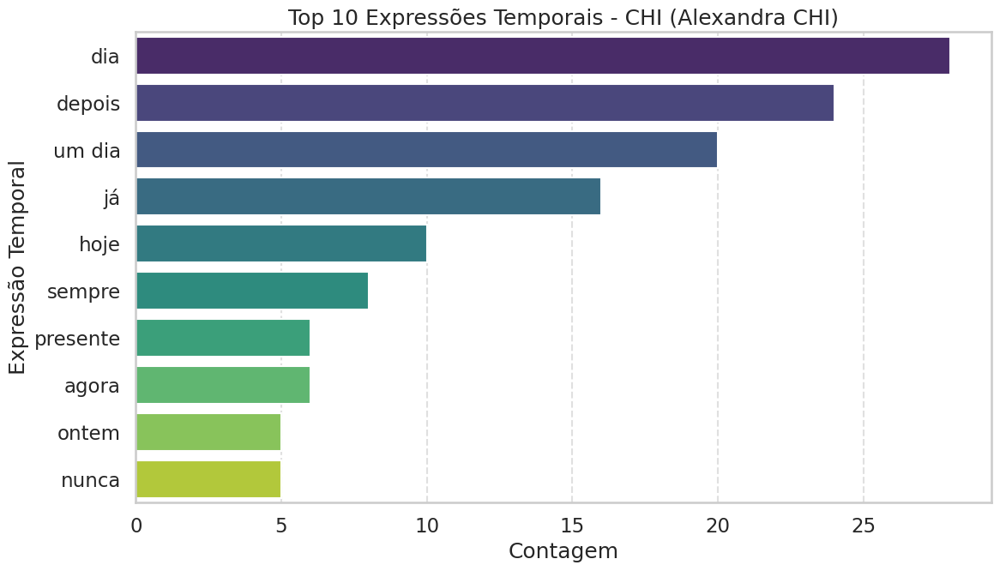

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


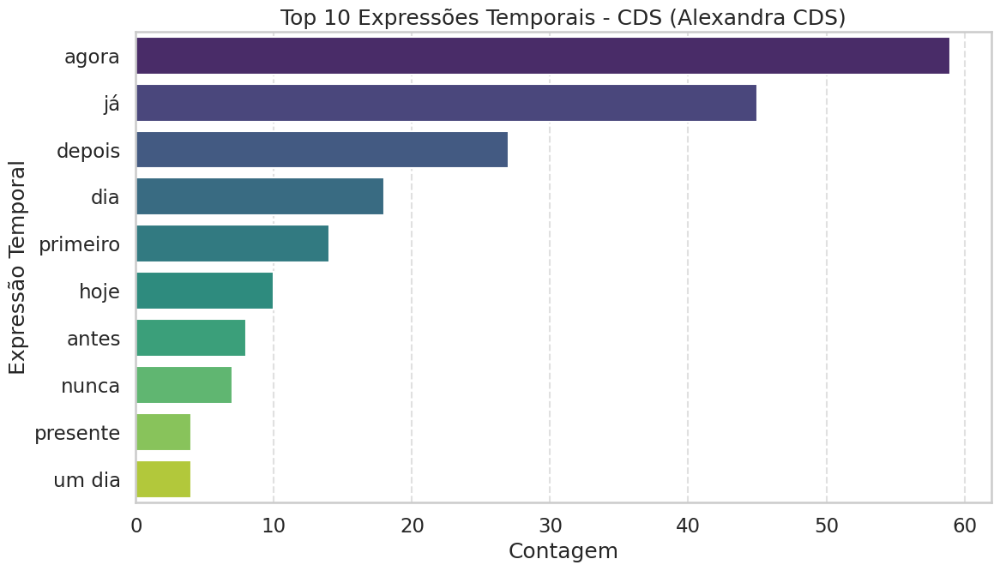

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:430: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=17 observations were given.
  return hypotest_fun_in(*args, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:430: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=17 observations were given.
  return hypotest_fun_in(*args, **kwds)


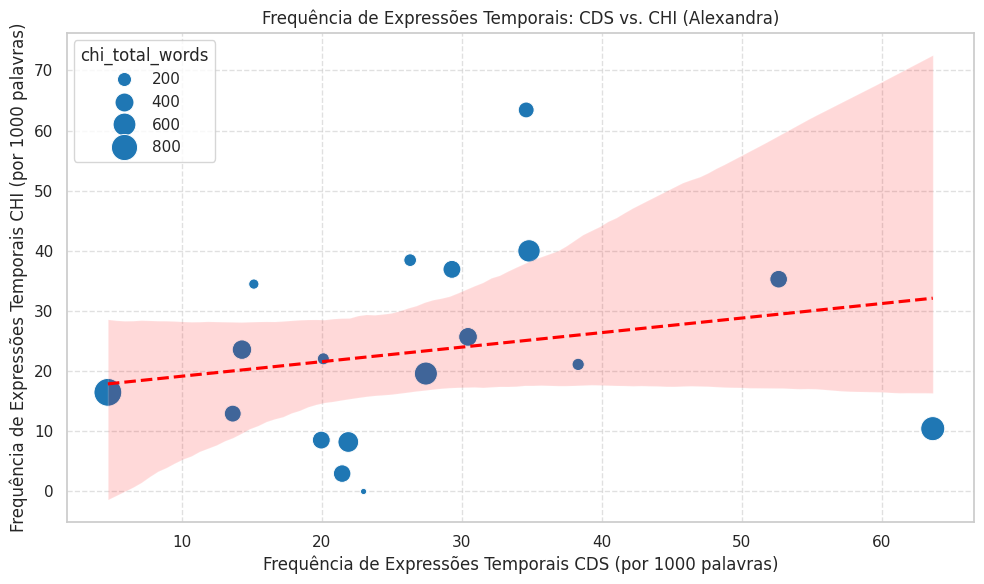

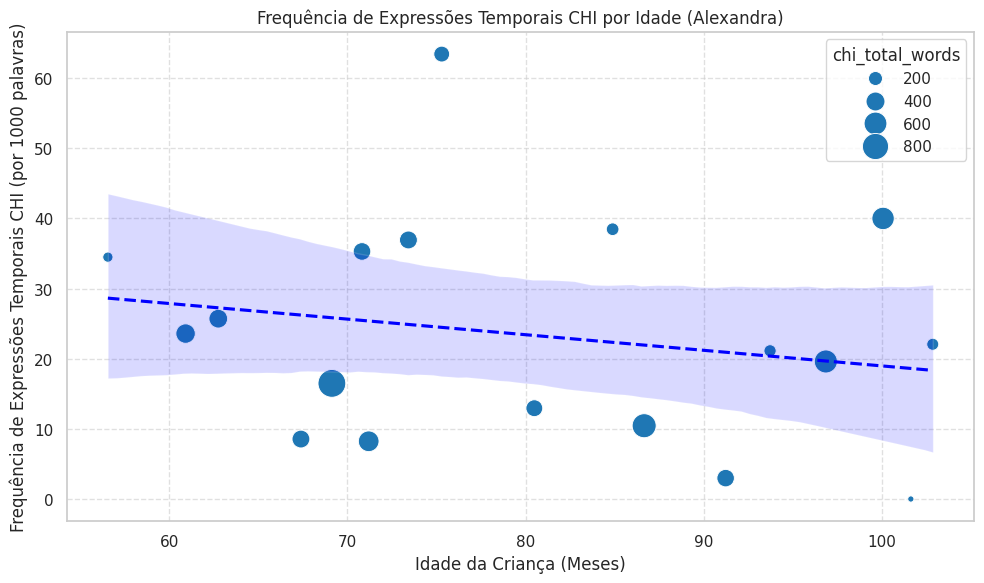

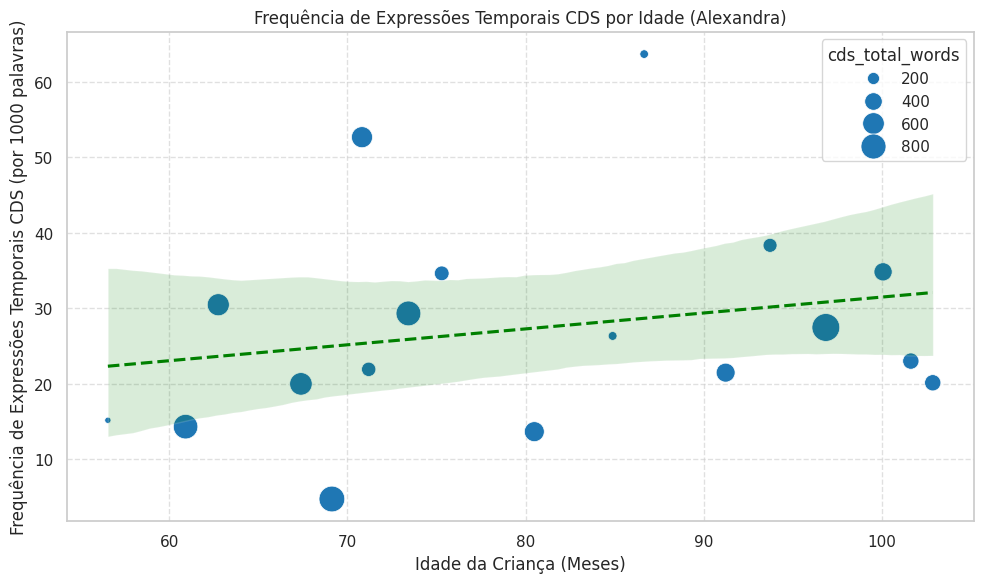

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


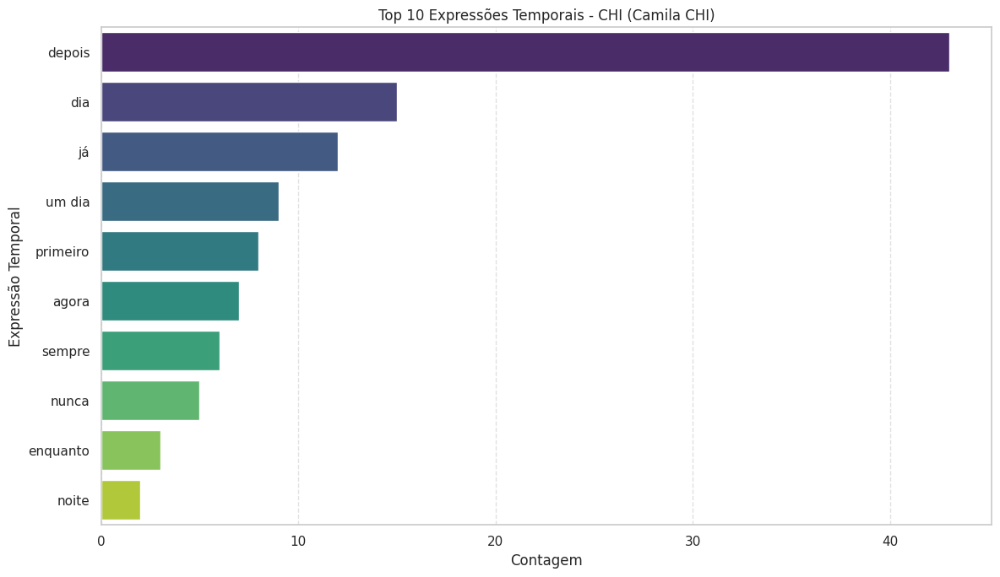

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


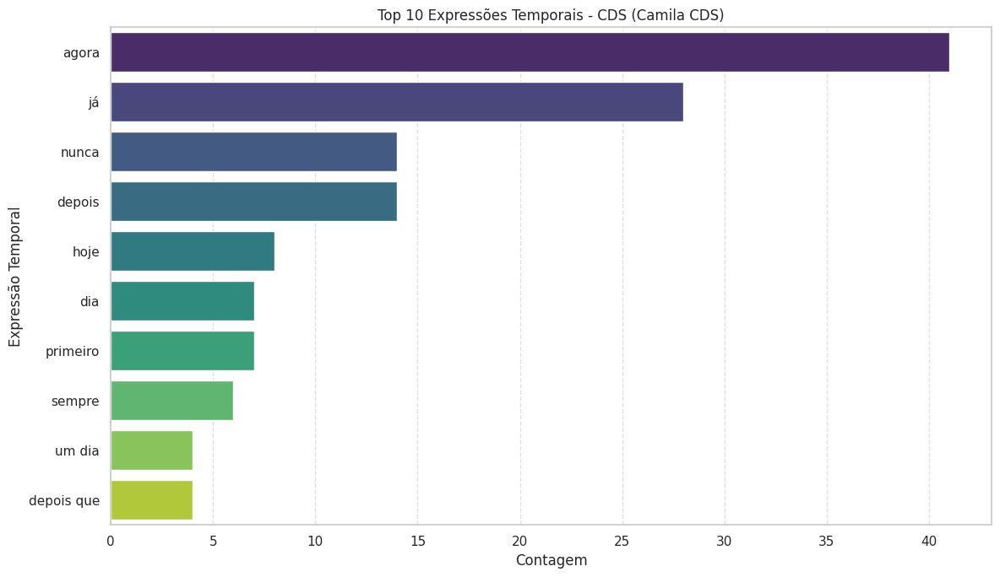

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:430: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=12 observations were given.
  return hypotest_fun_in(*args, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:430: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=12 observations were given.
  return hypotest_fun_in(*args, **kwds)


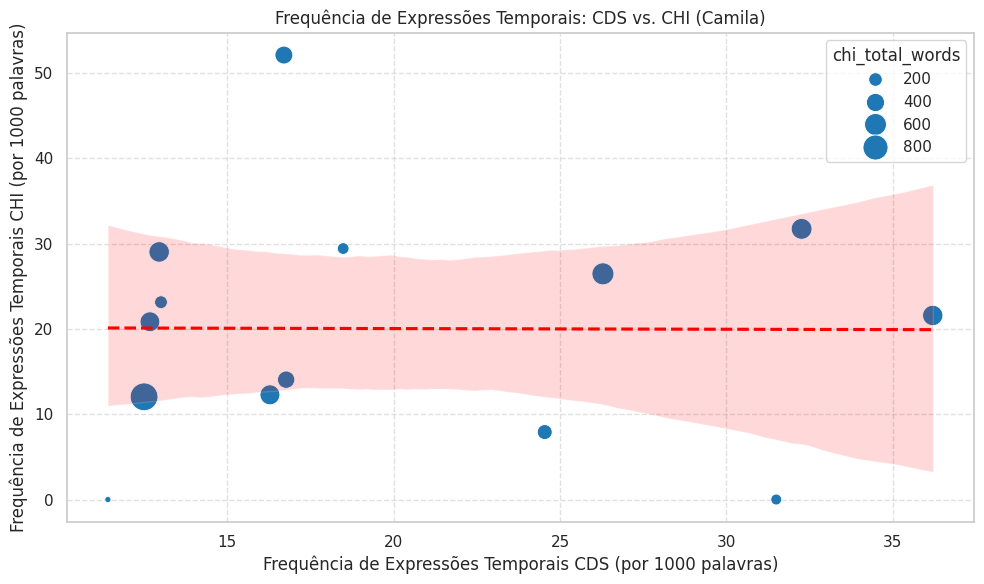

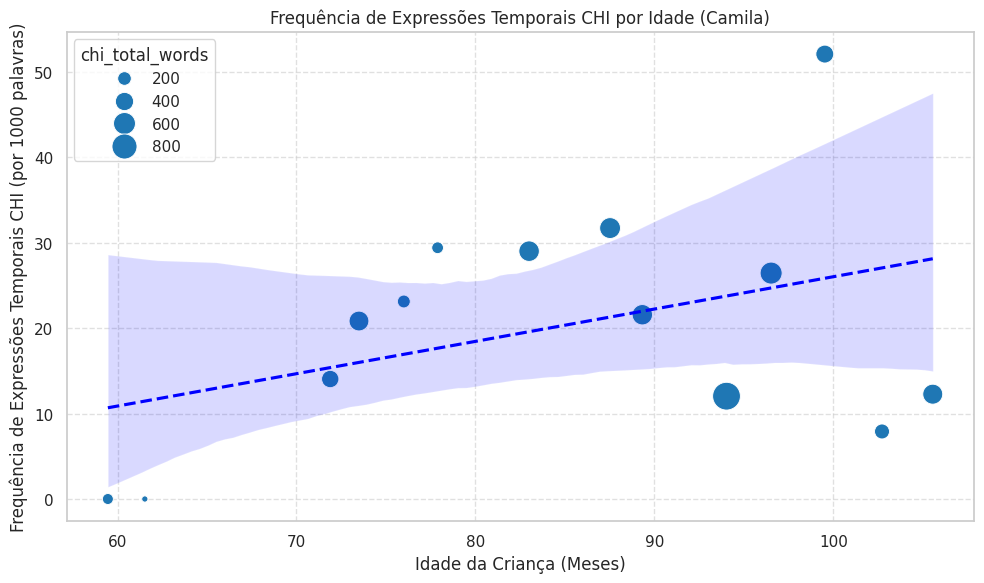

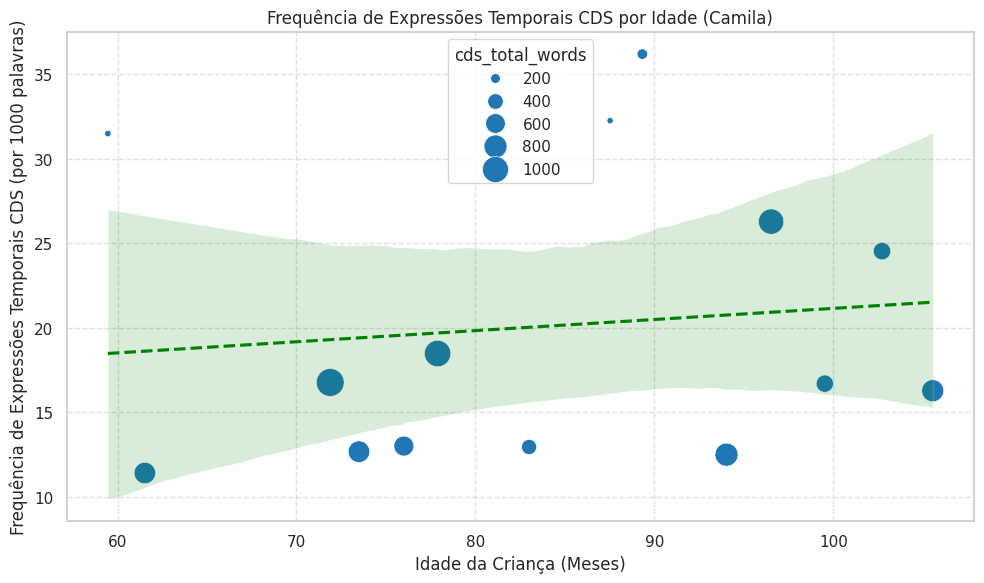

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


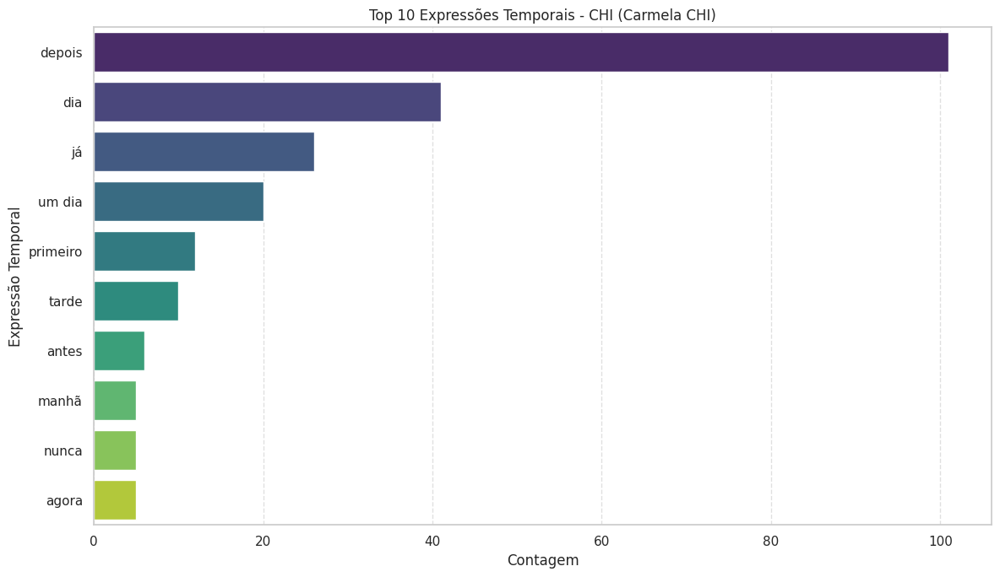

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


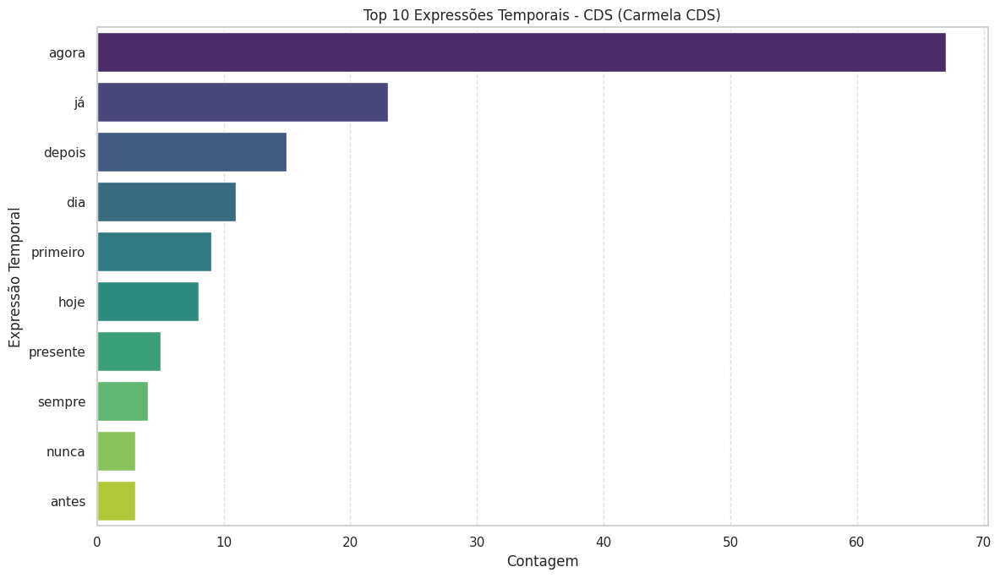

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:430: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=17 observations were given.
  return hypotest_fun_in(*args, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:430: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=17 observations were given.
  return hypotest_fun_in(*args, **kwds)


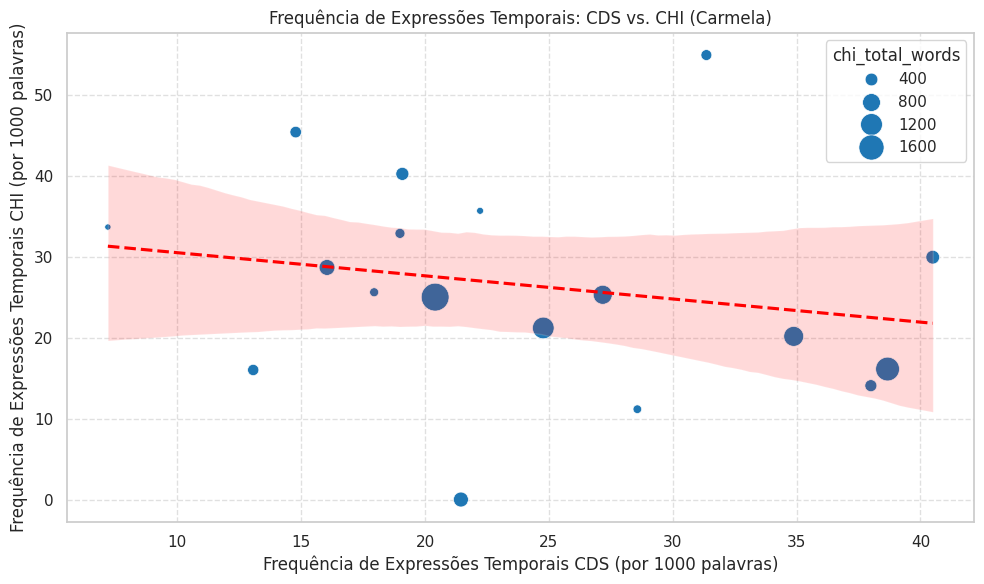

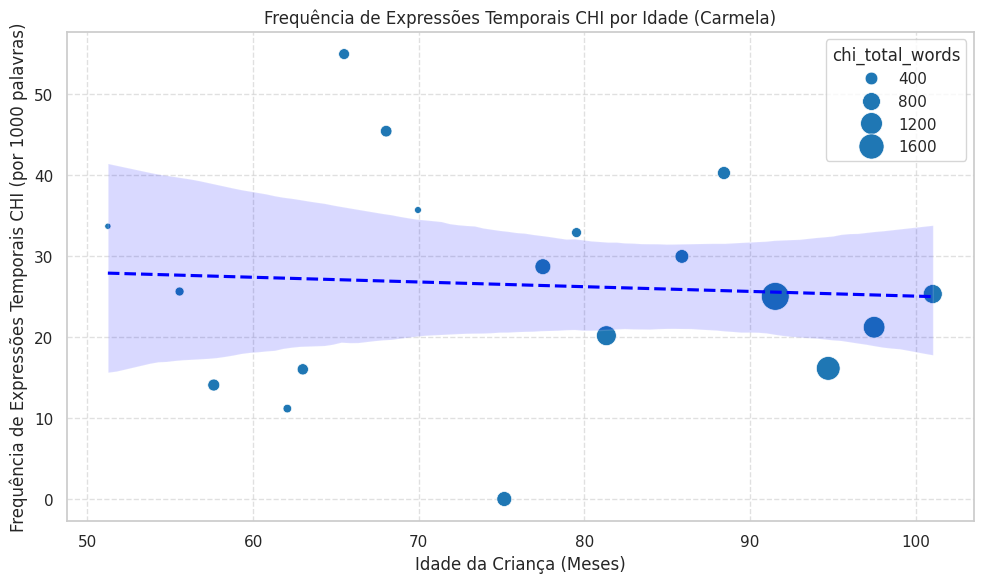

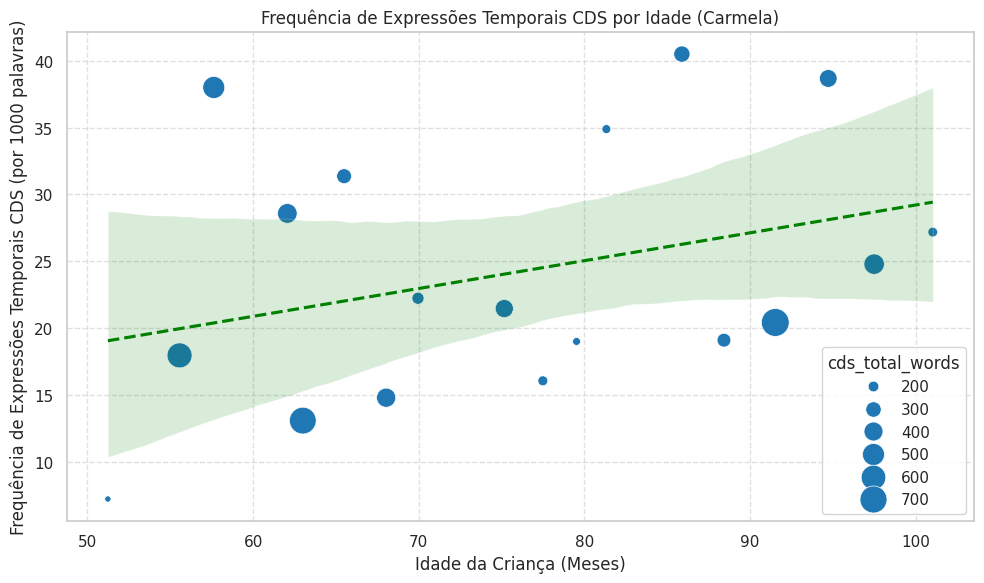

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


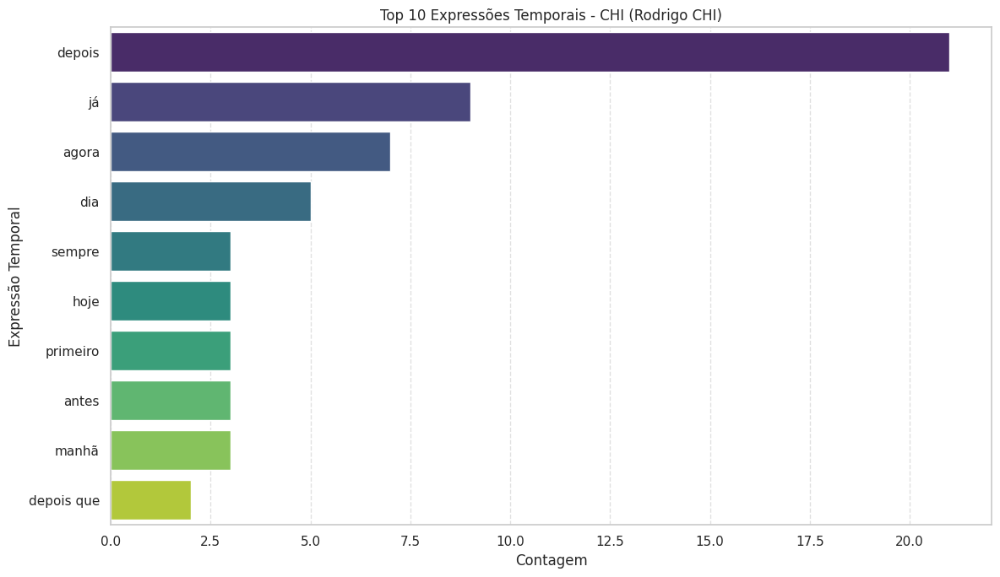

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


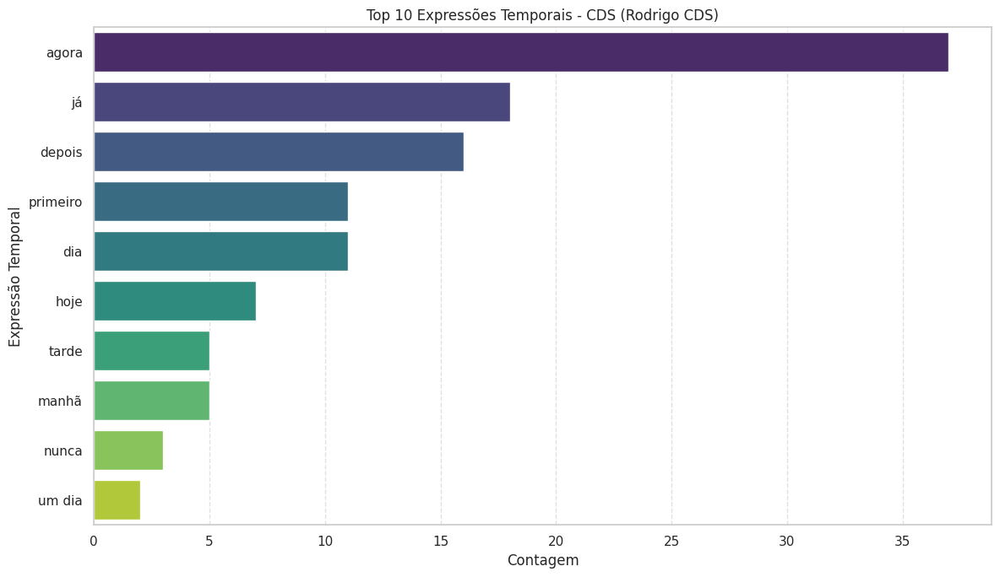

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:430: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=8 observations were given.
  return hypotest_fun_in(*args, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:430: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=8 observations were given.
  return hypotest_fun_in(*args, **kwds)


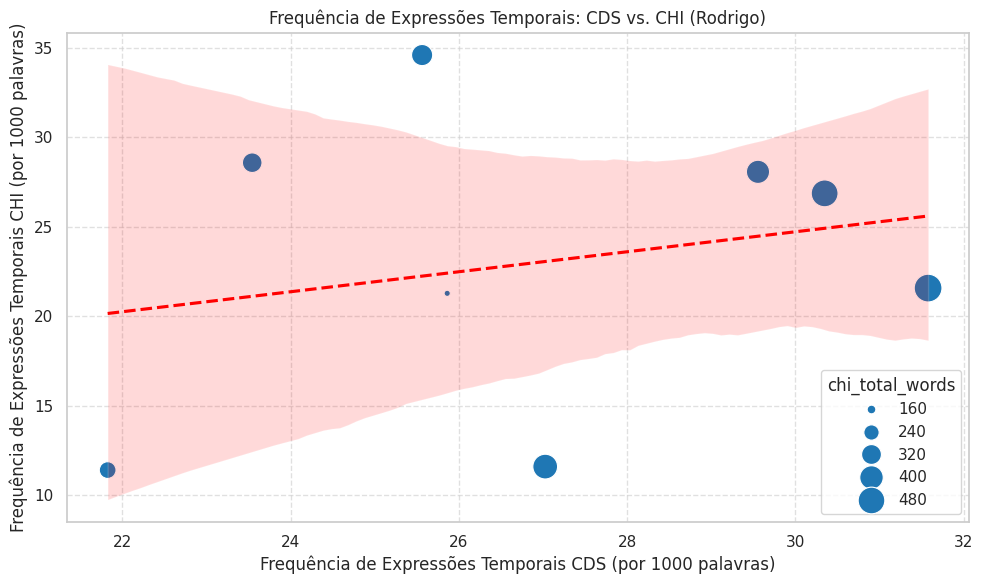

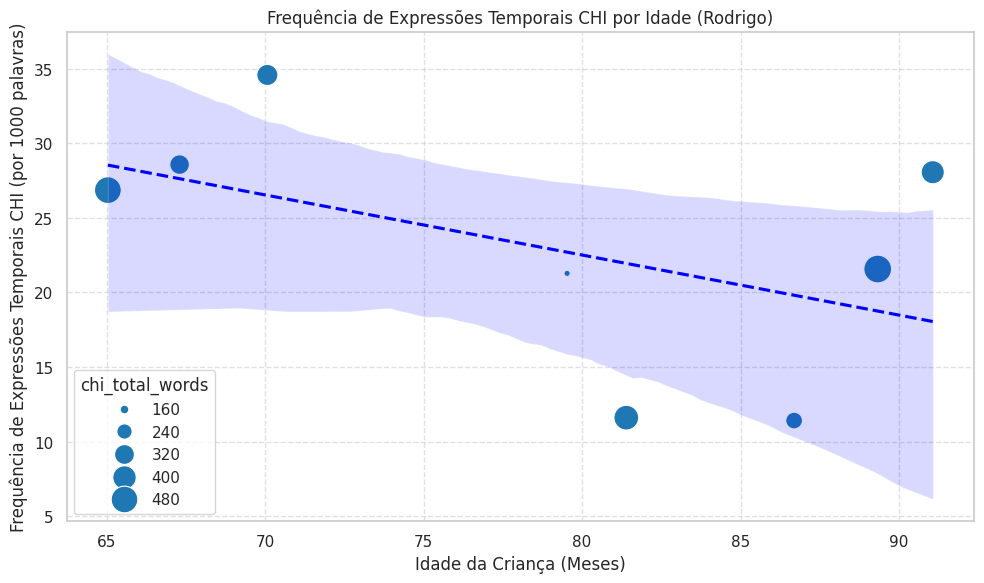

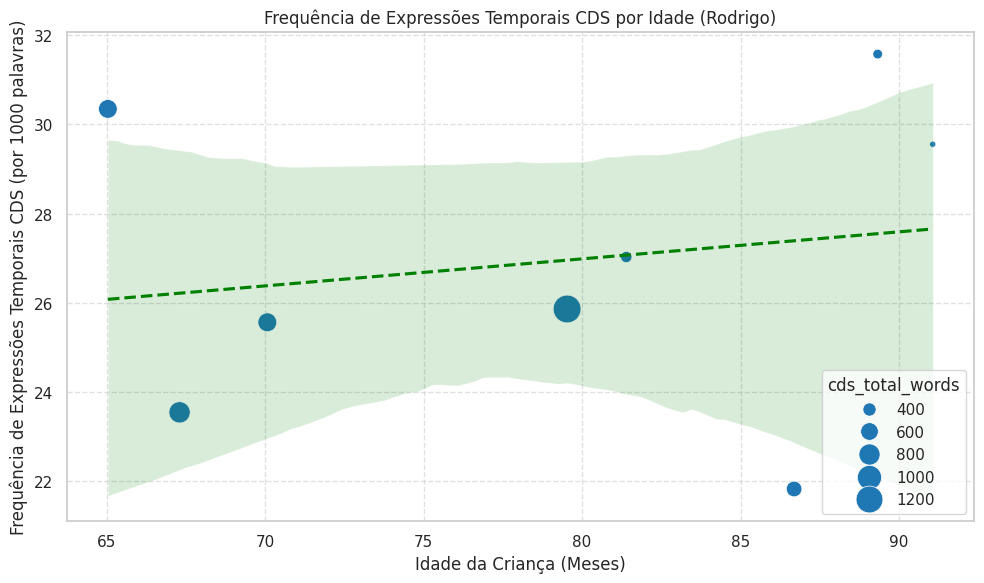

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


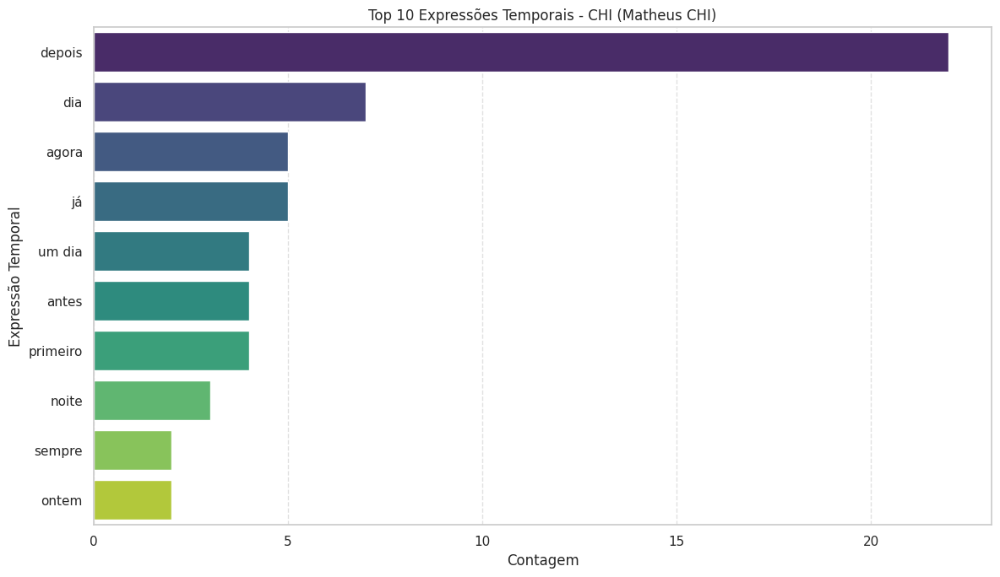

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


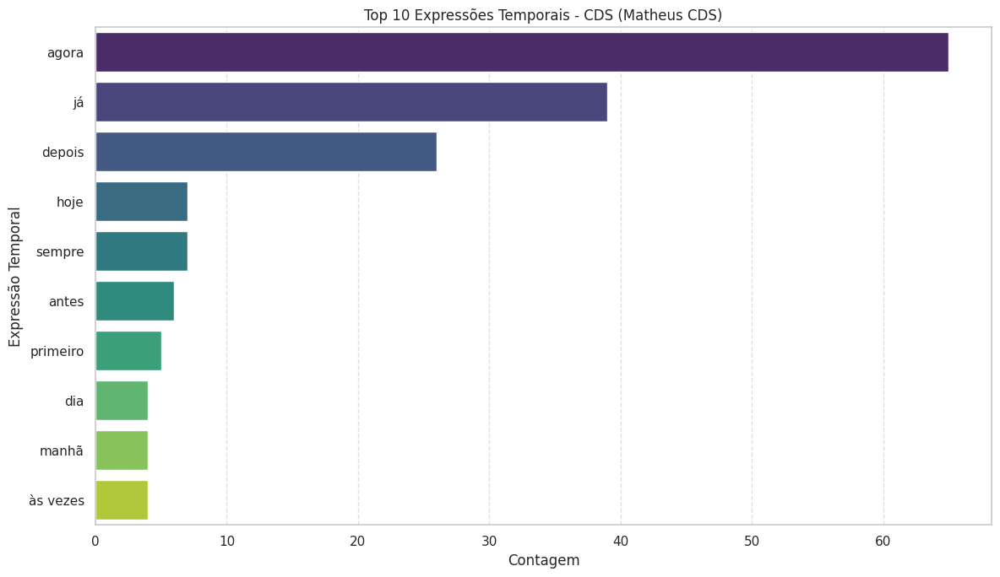

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:430: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=8 observations were given.
  return hypotest_fun_in(*args, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:430: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=8 observations were given.
  return hypotest_fun_in(*args, **kwds)


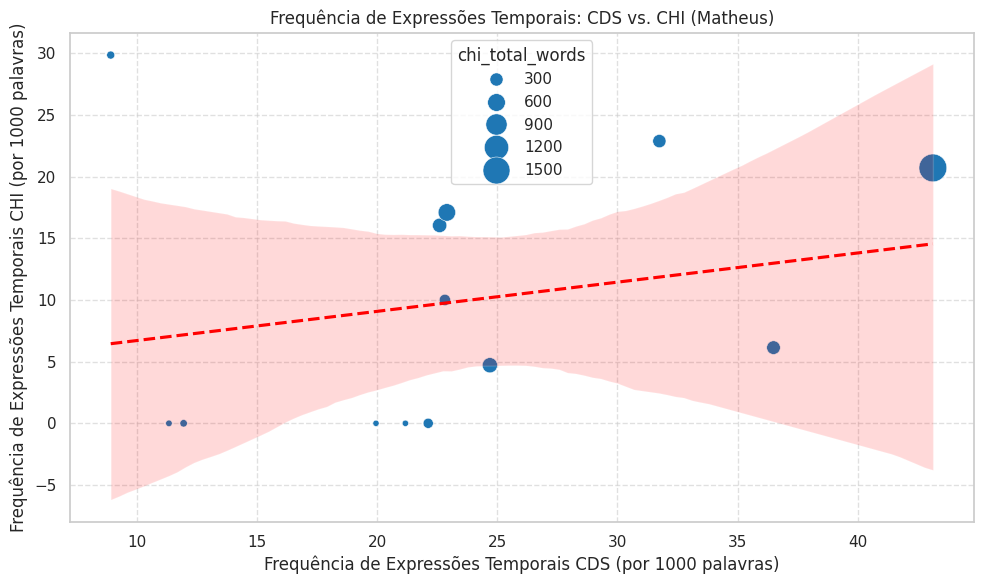

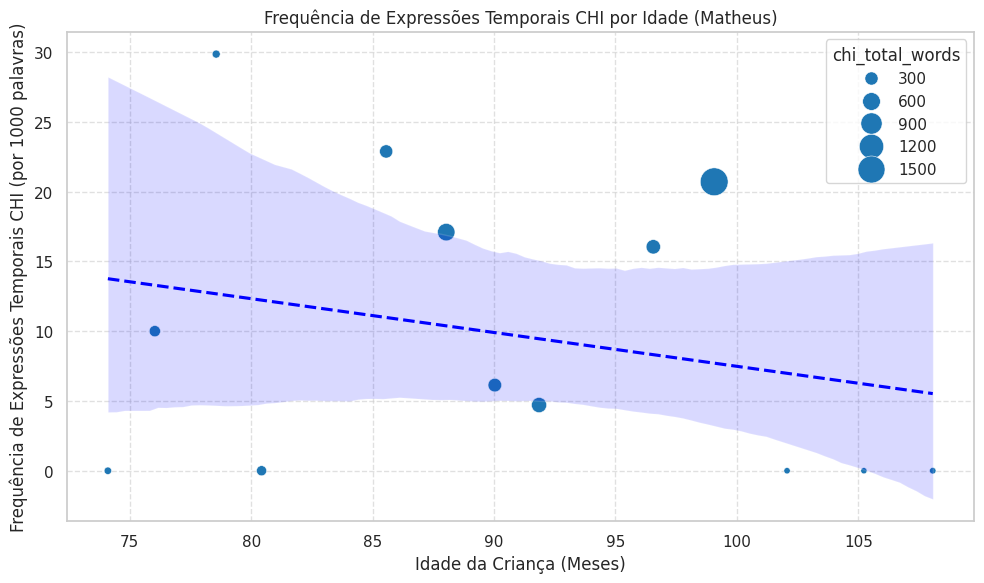

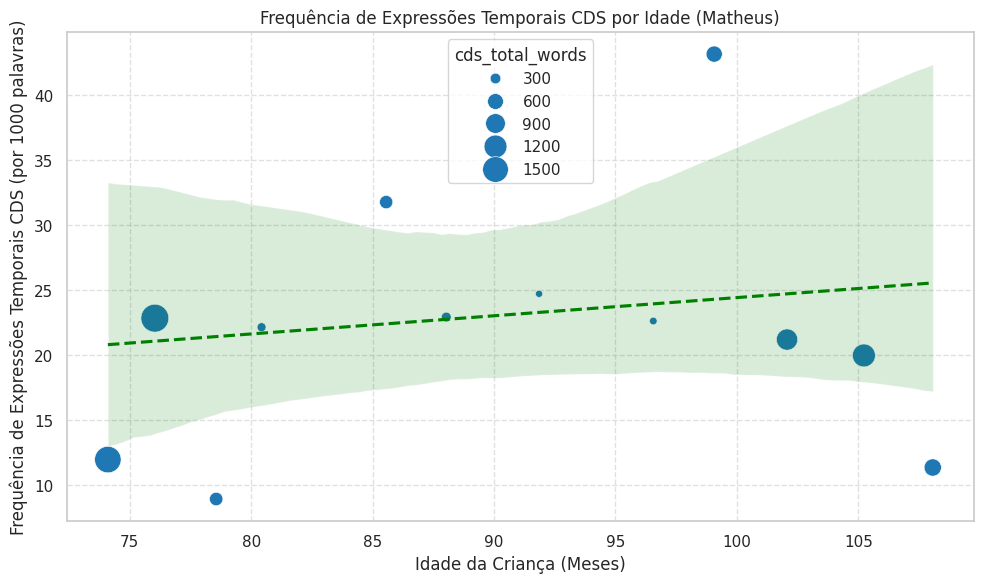

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


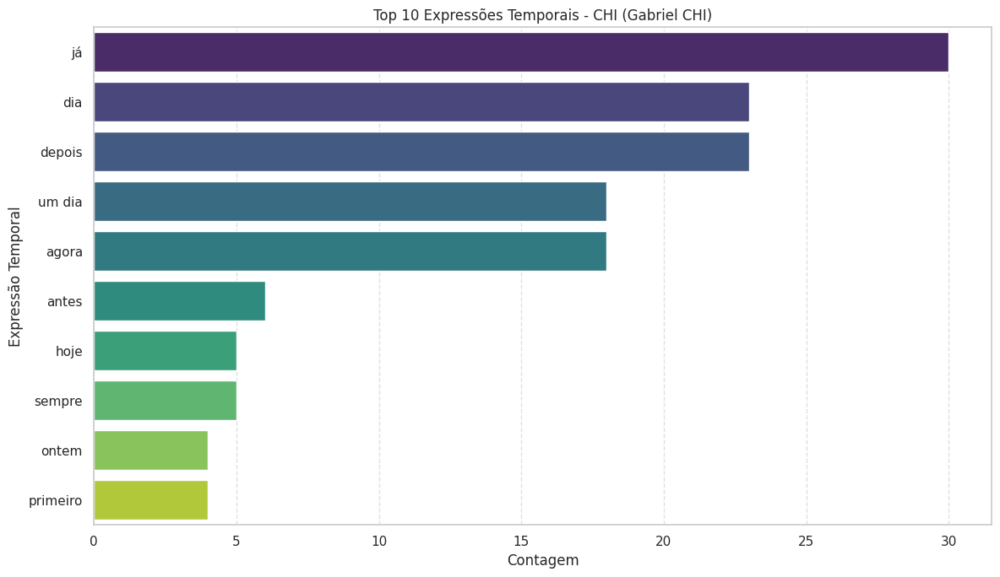

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


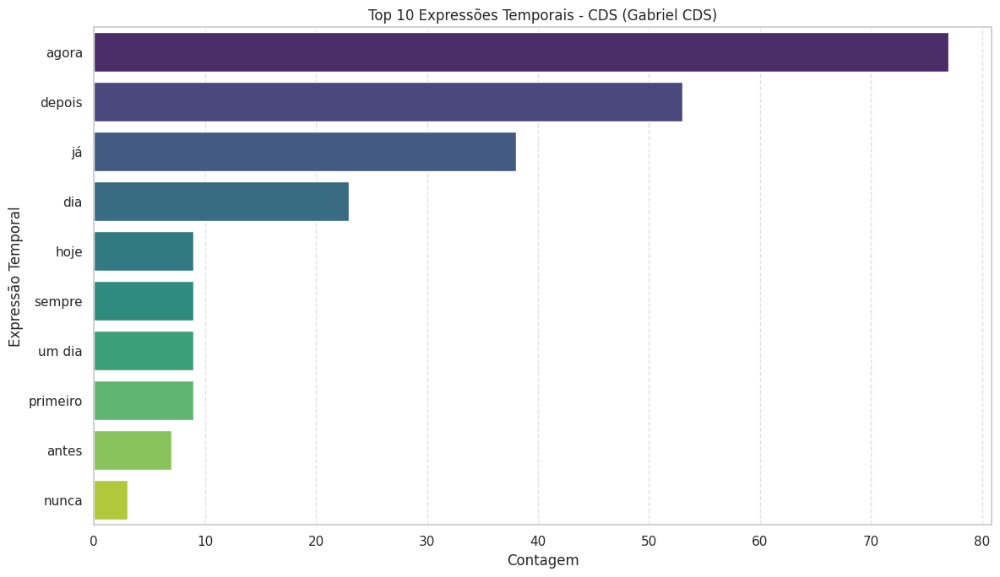

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:430: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=12 observations were given.
  return hypotest_fun_in(*args, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:430: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=12 observations were given.
  return hypotest_fun_in(*args, **kwds)


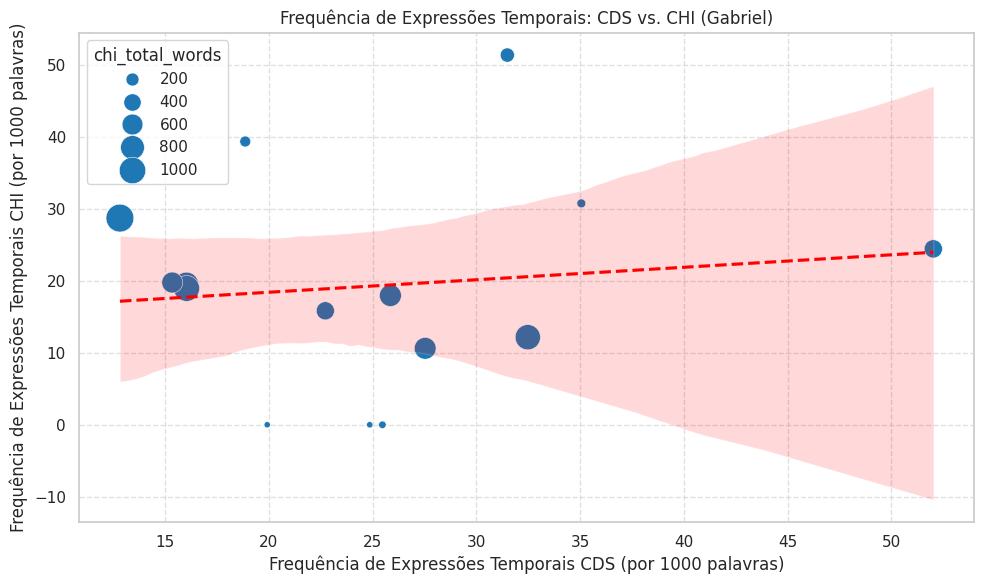

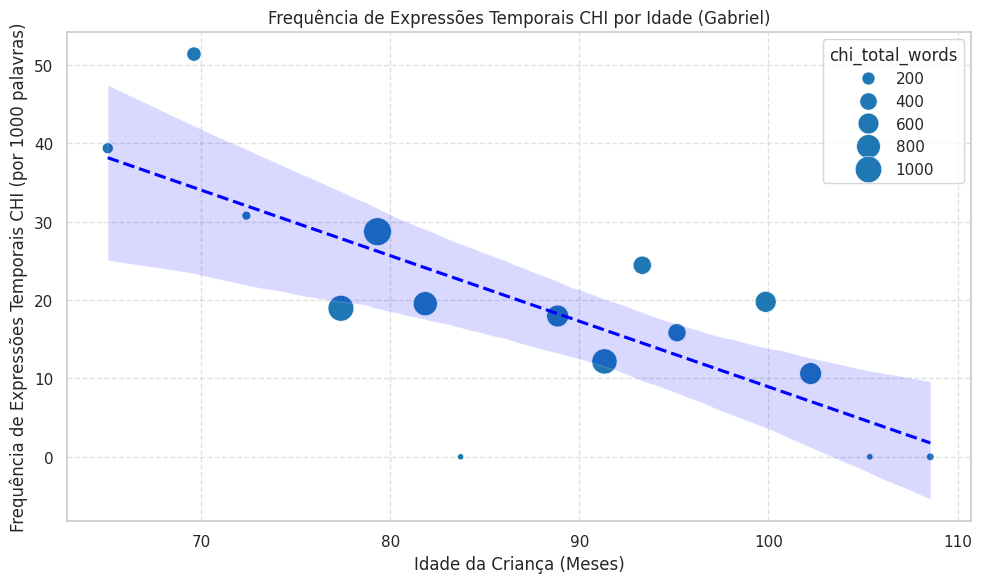

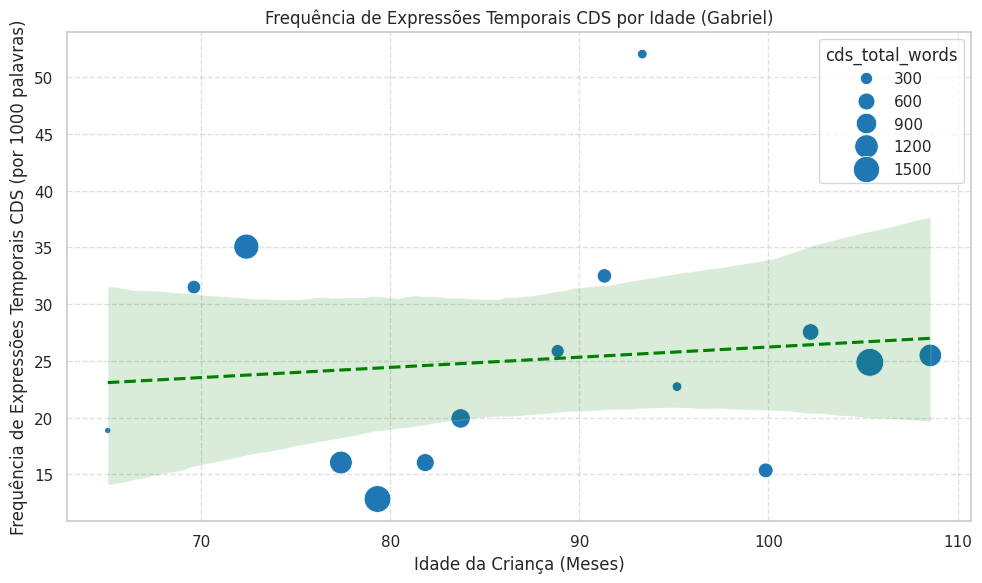

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


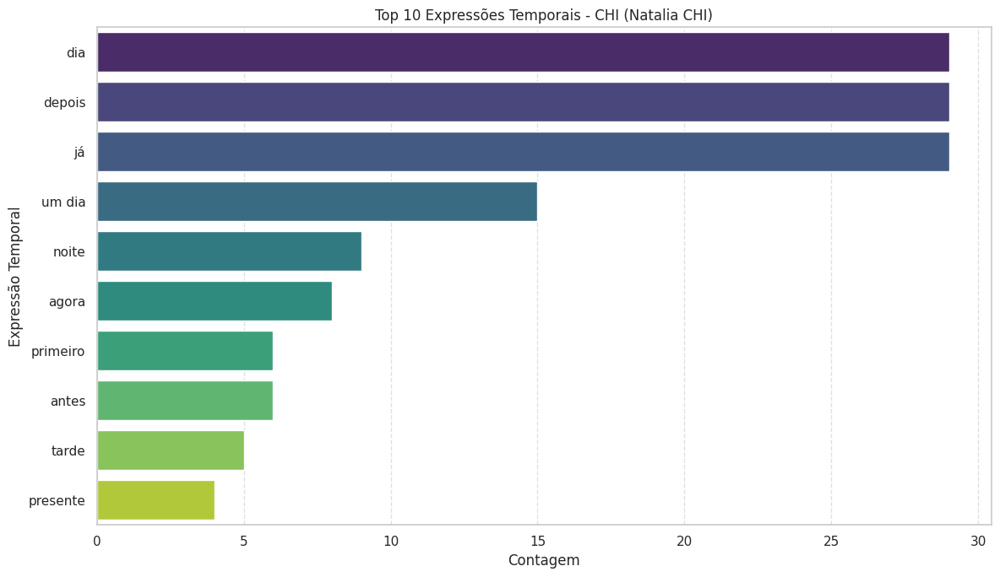

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


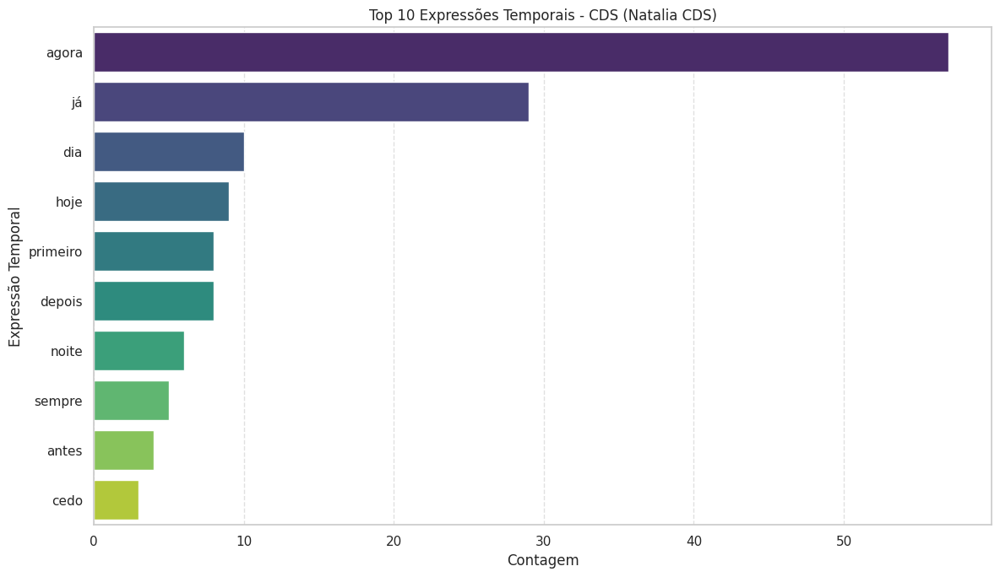

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:430: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=14 observations were given.
  return hypotest_fun_in(*args, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:430: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=14 observations were given.
  return hypotest_fun_in(*args, **kwds)


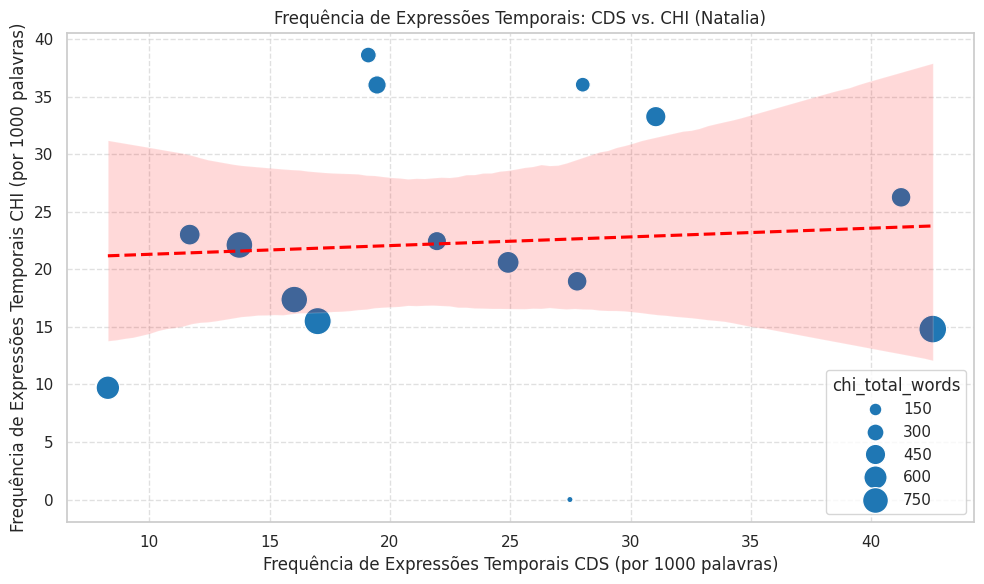

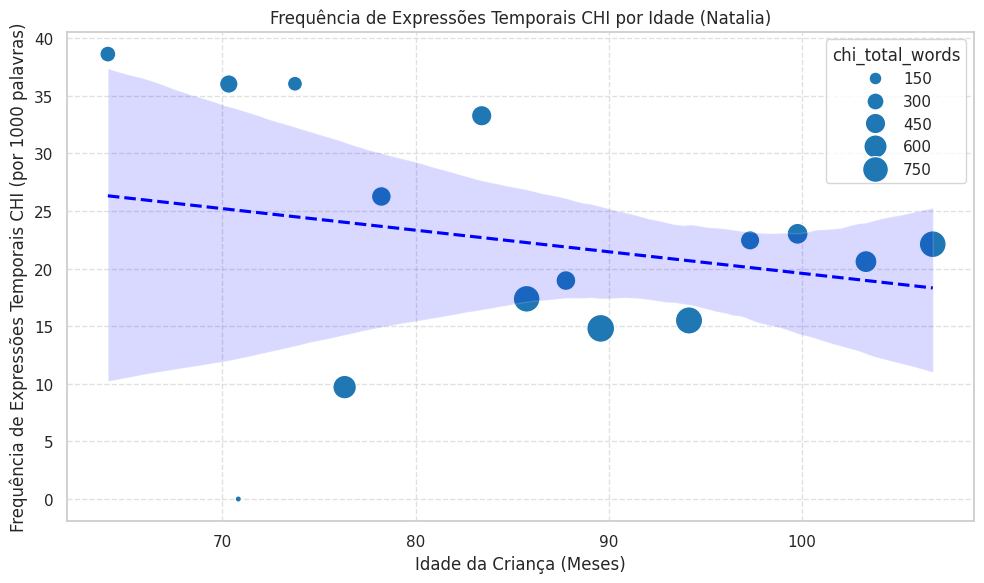

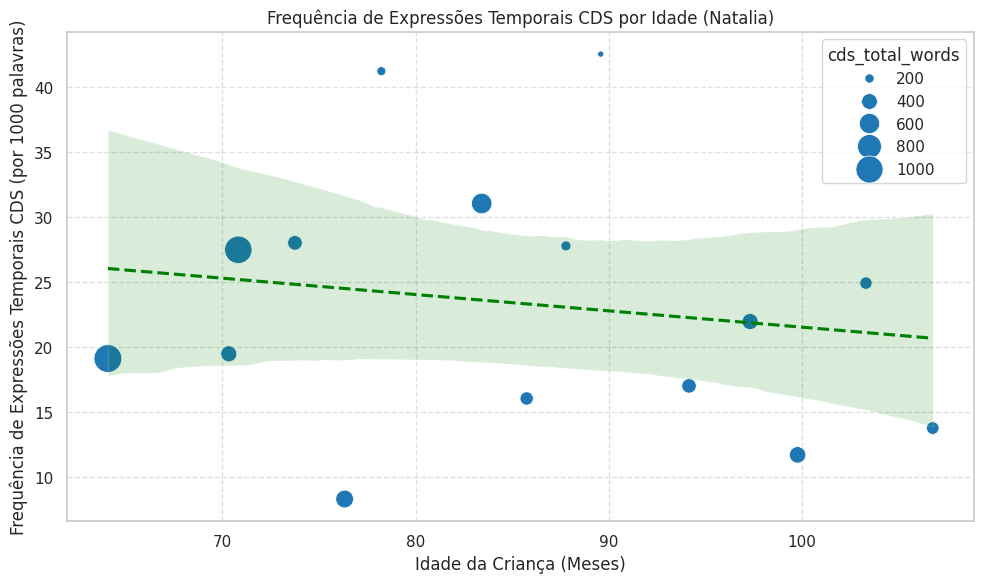

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


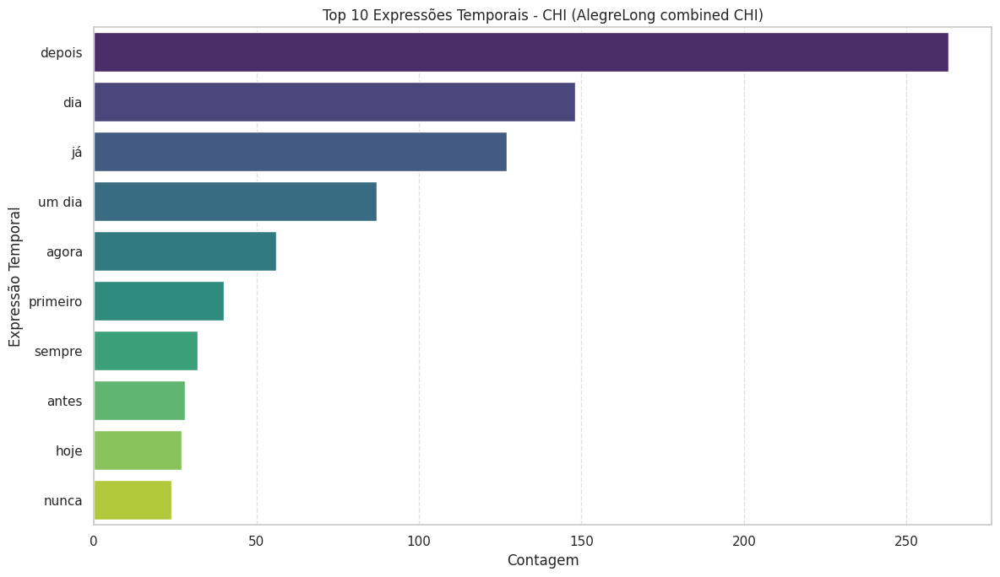

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


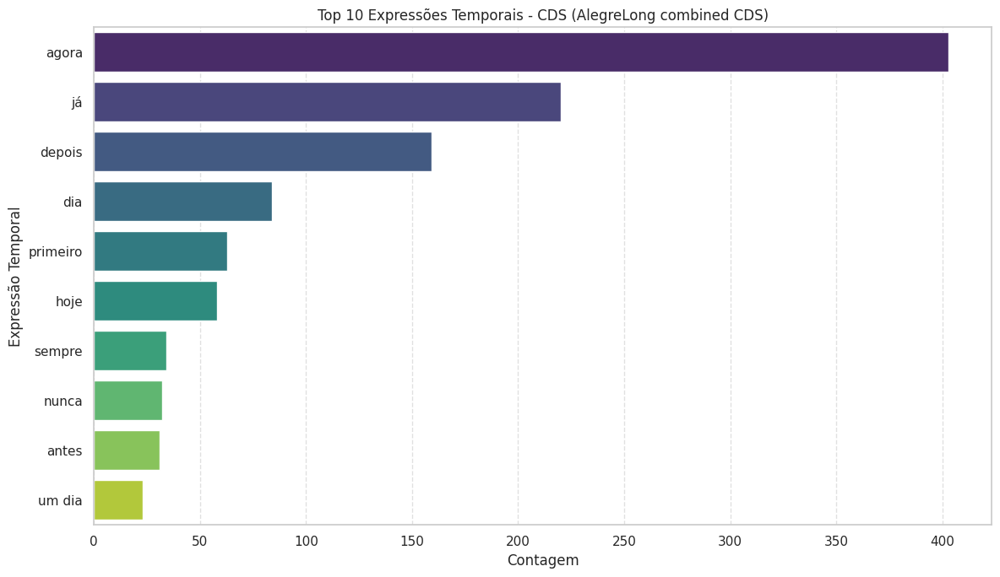

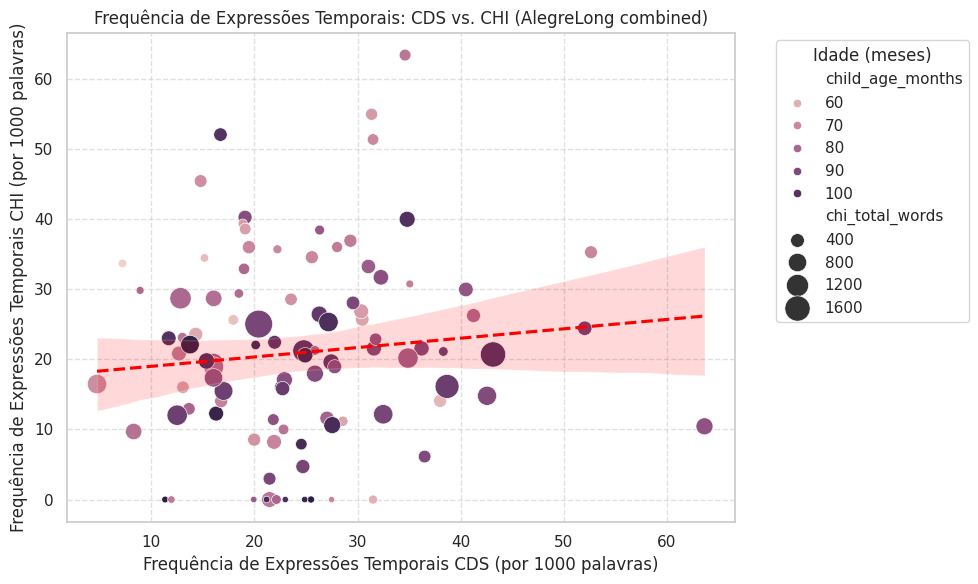

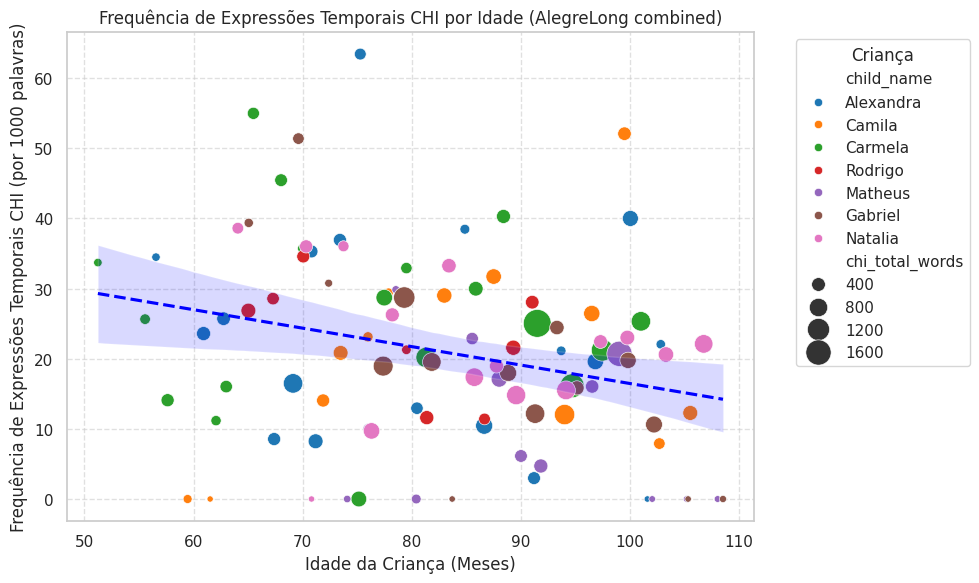

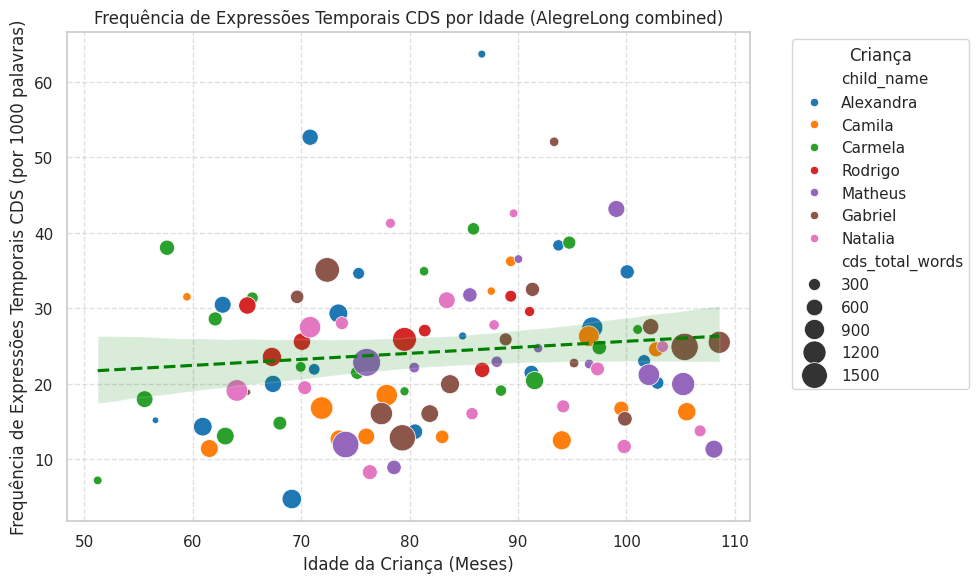

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


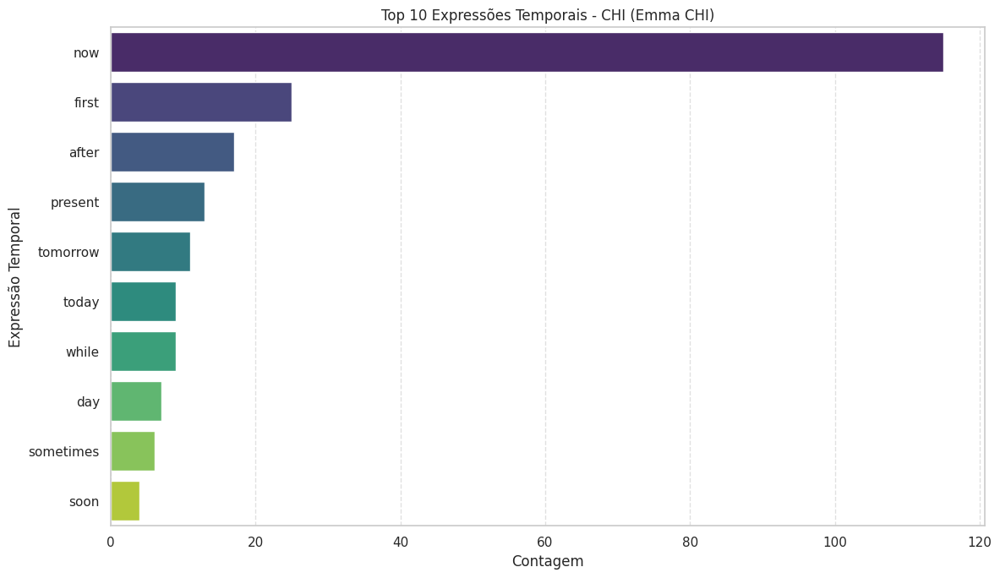

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


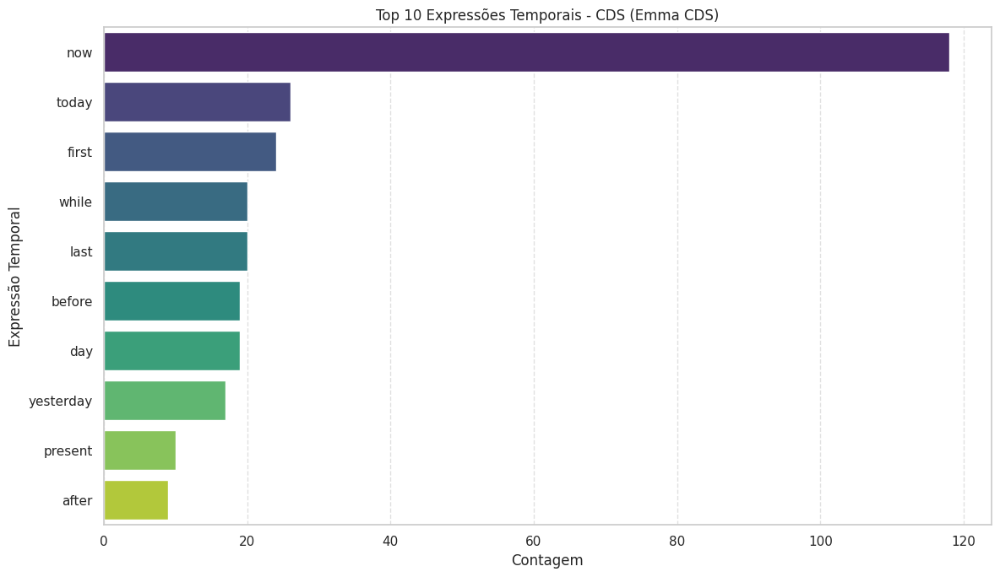

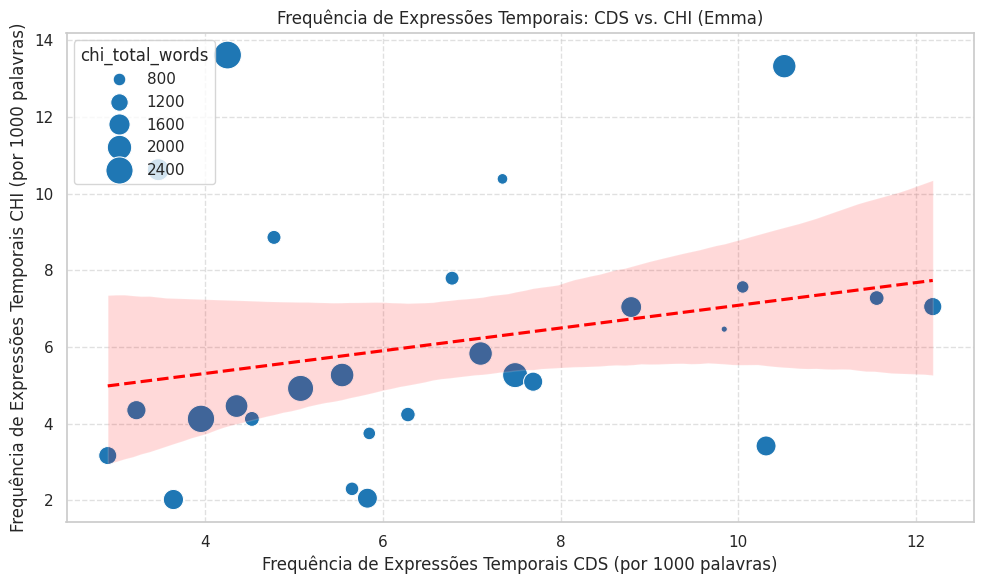

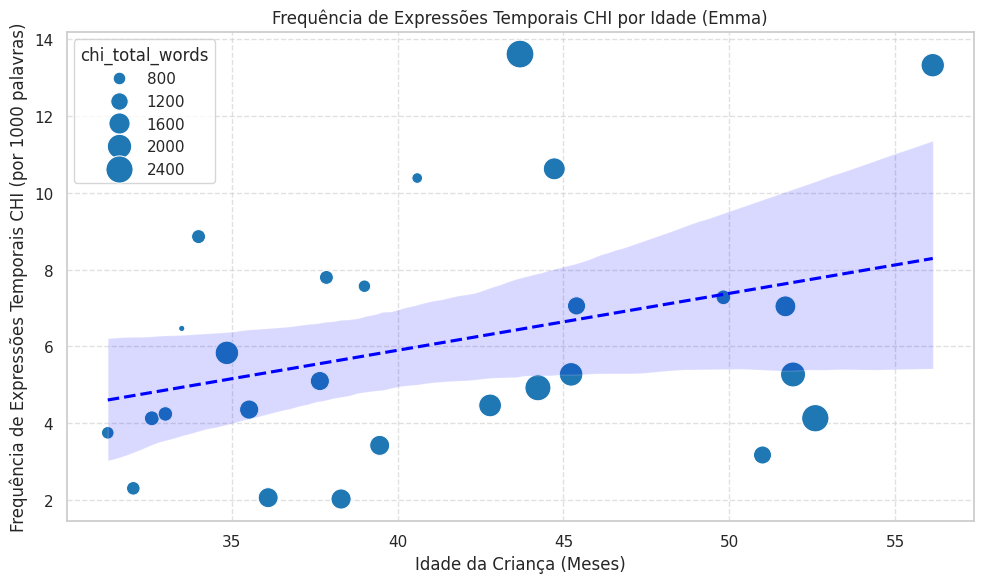

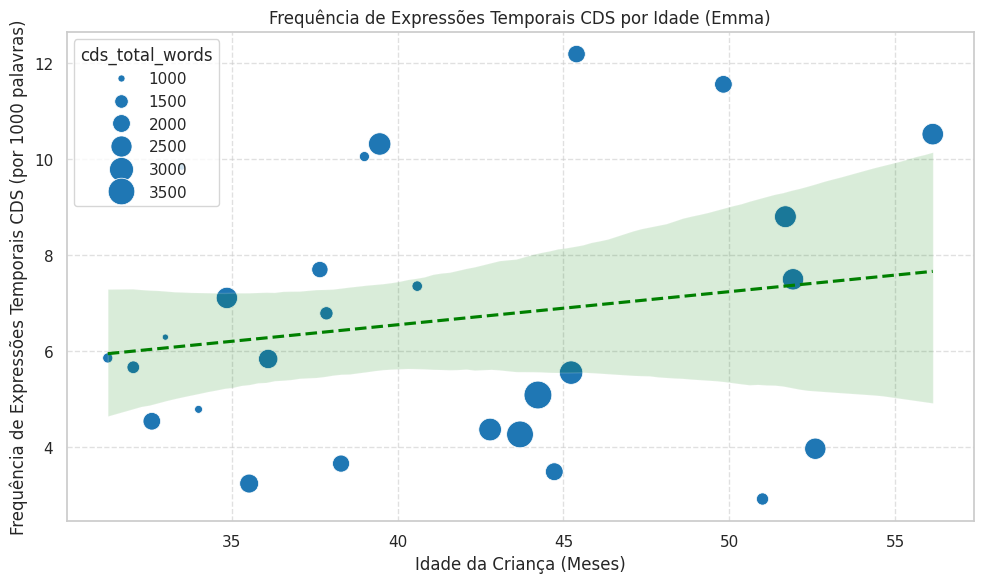

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


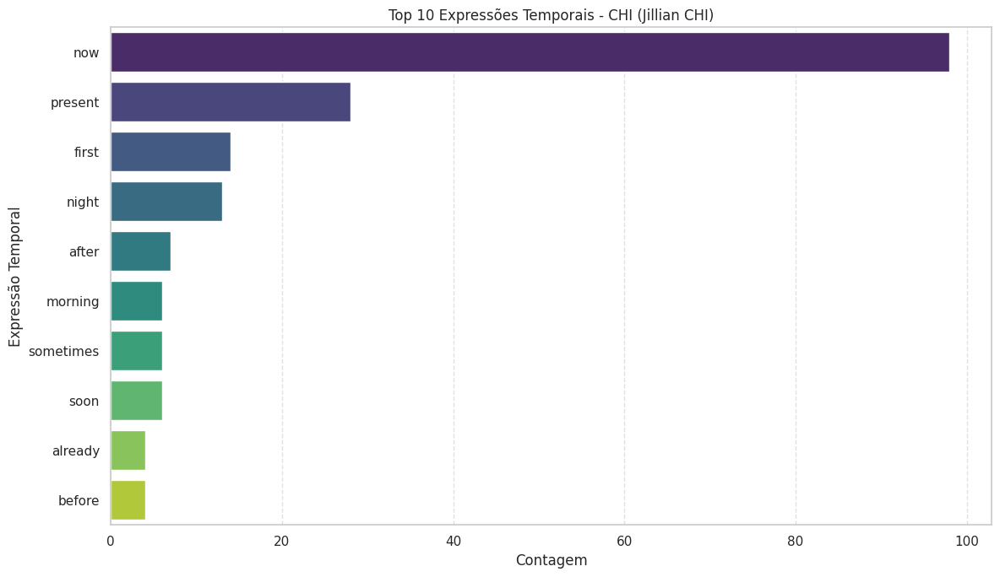

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


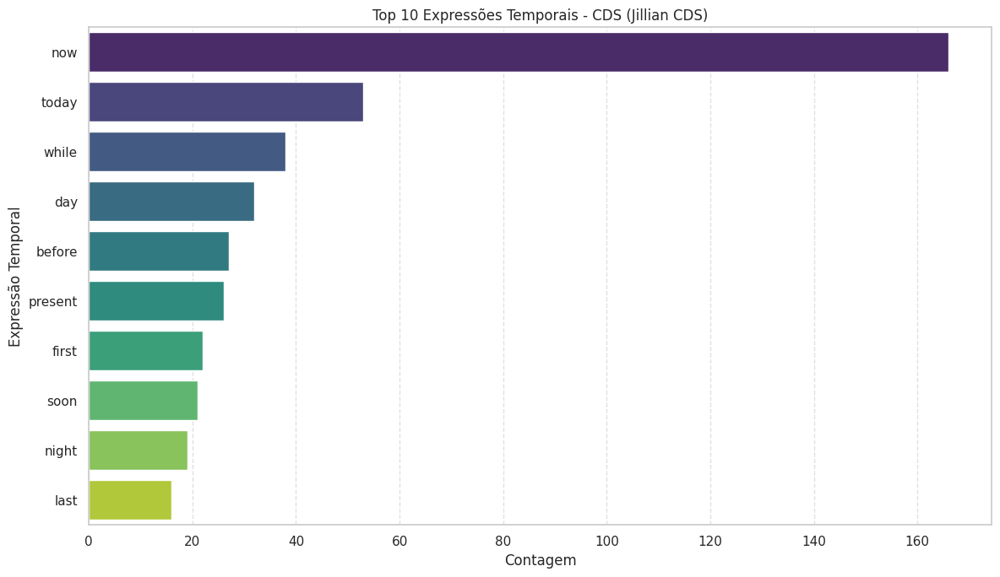

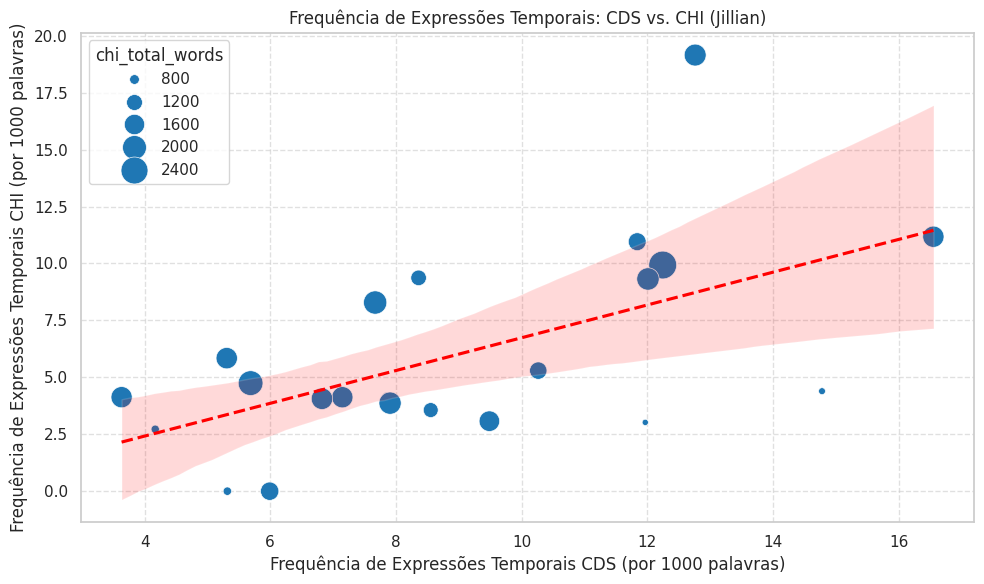

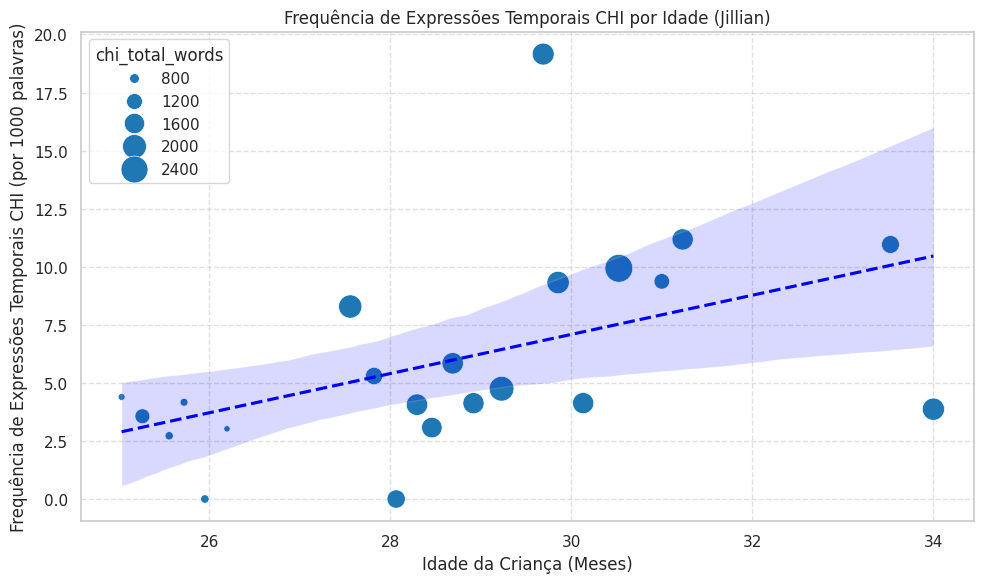

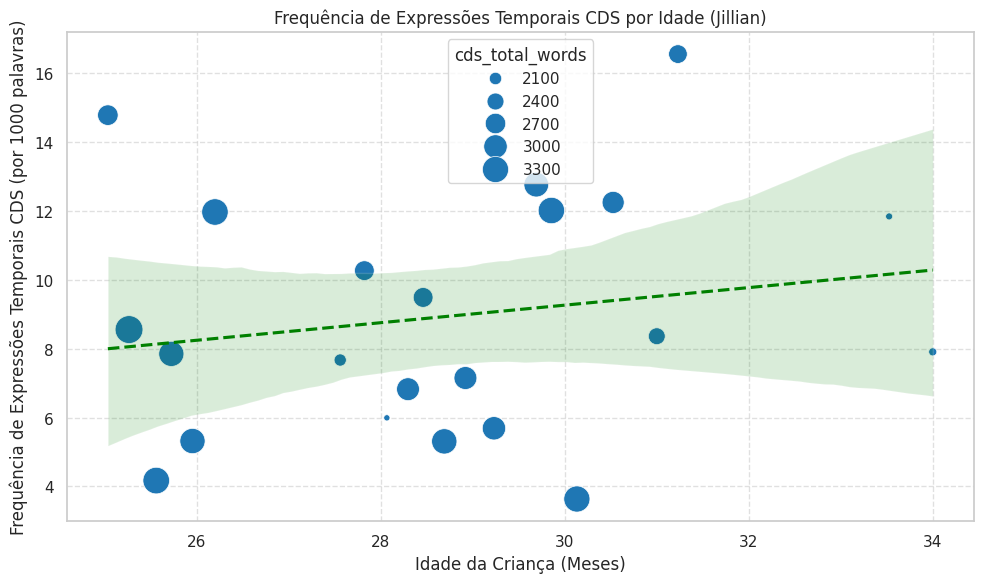

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


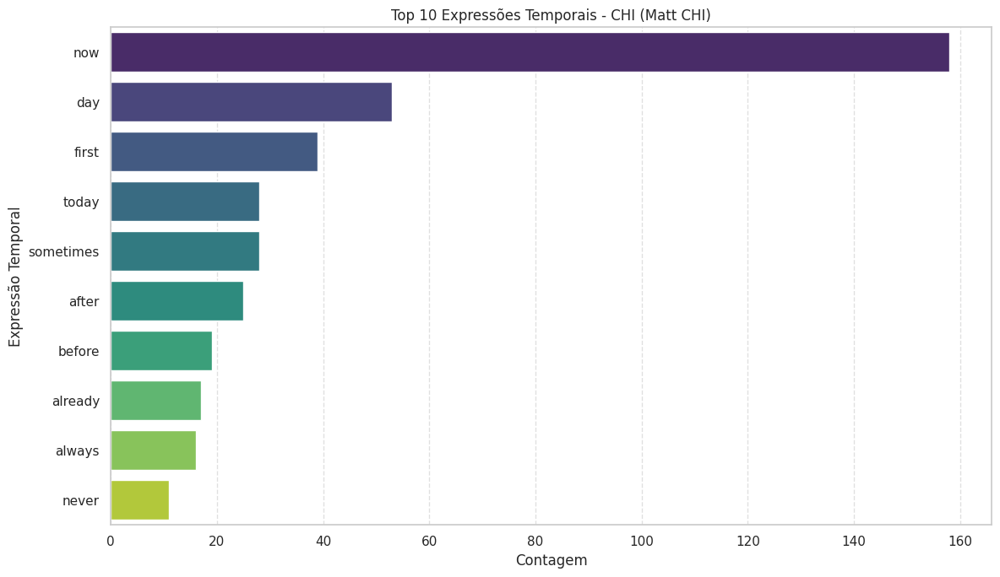

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


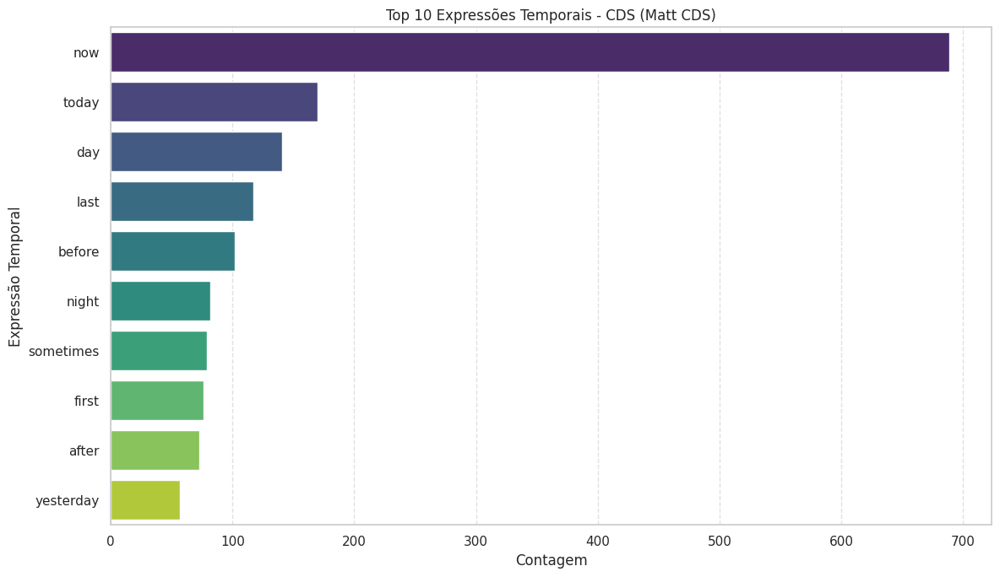

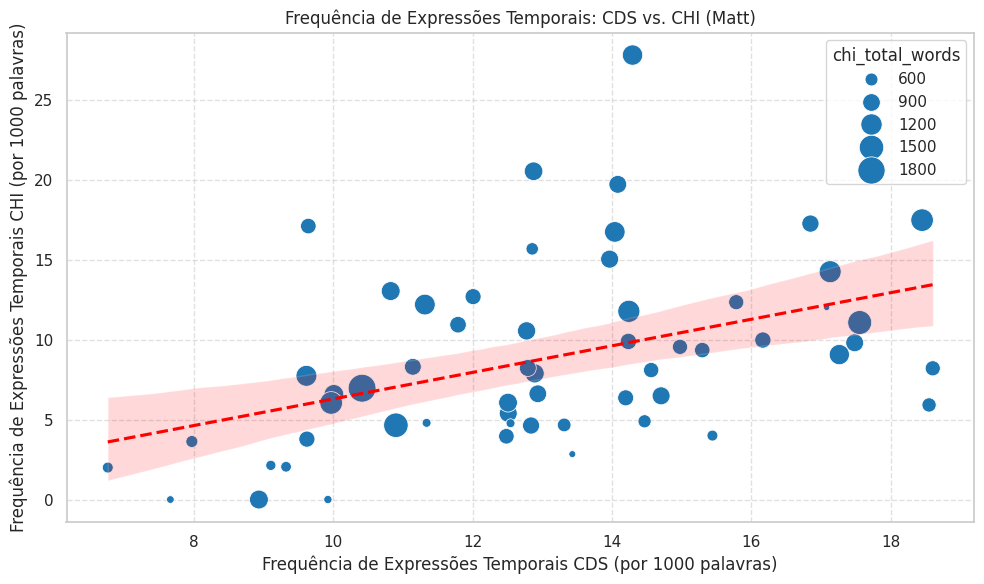

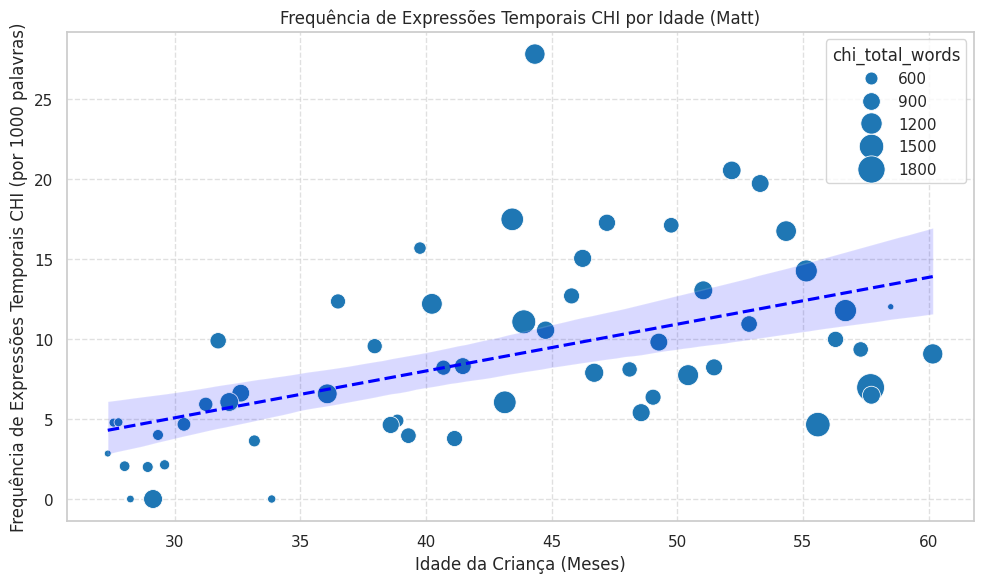

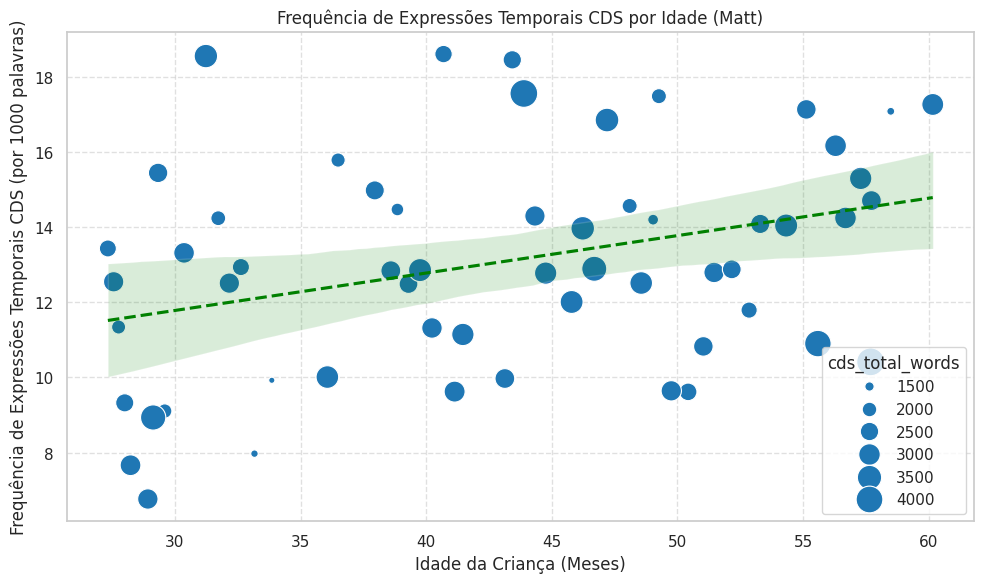

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


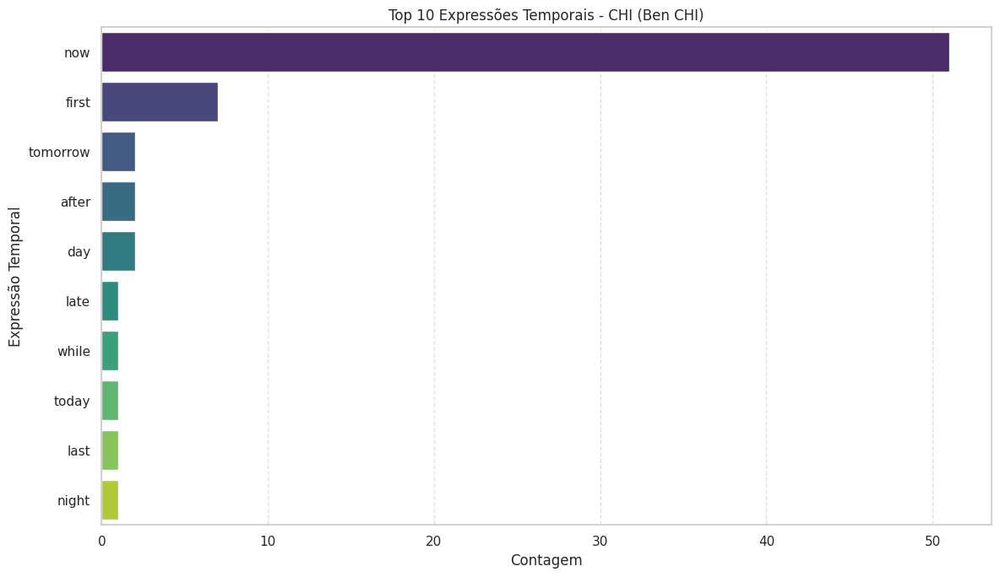

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


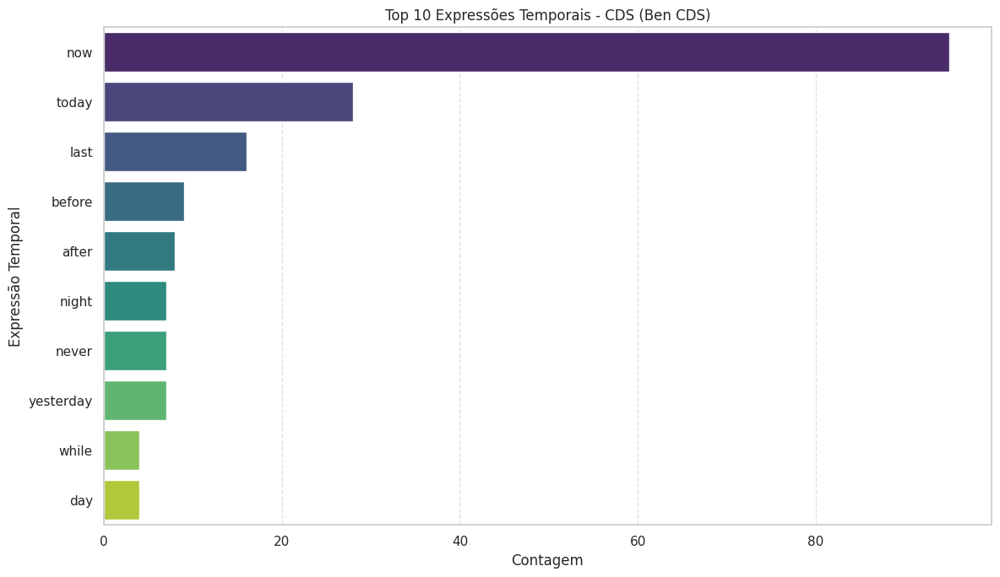

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:430: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=10 observations were given.
  return hypotest_fun_in(*args, **kwds)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:430: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=10 observations were given.
  return hypotest_fun_in(*args, **kwds)


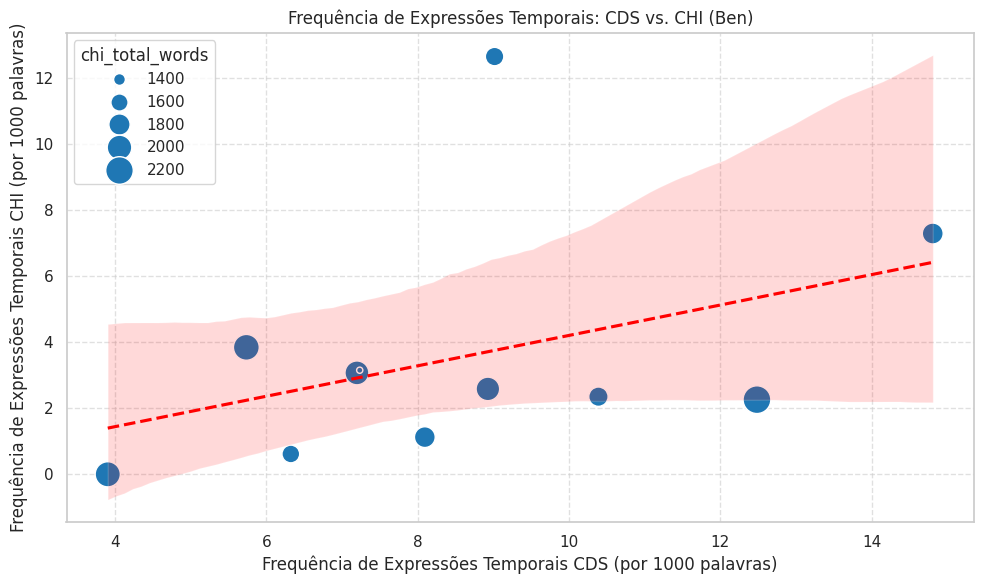

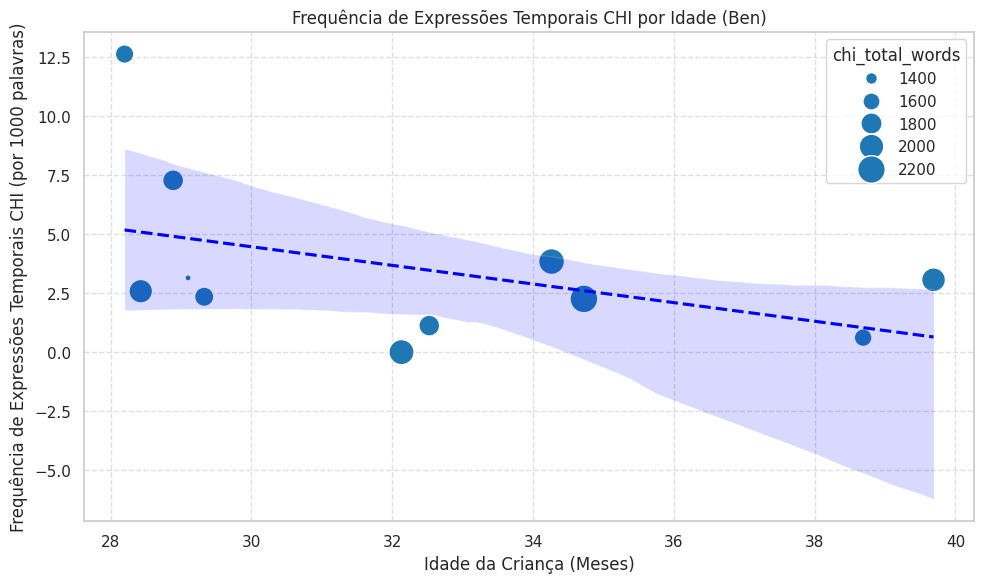

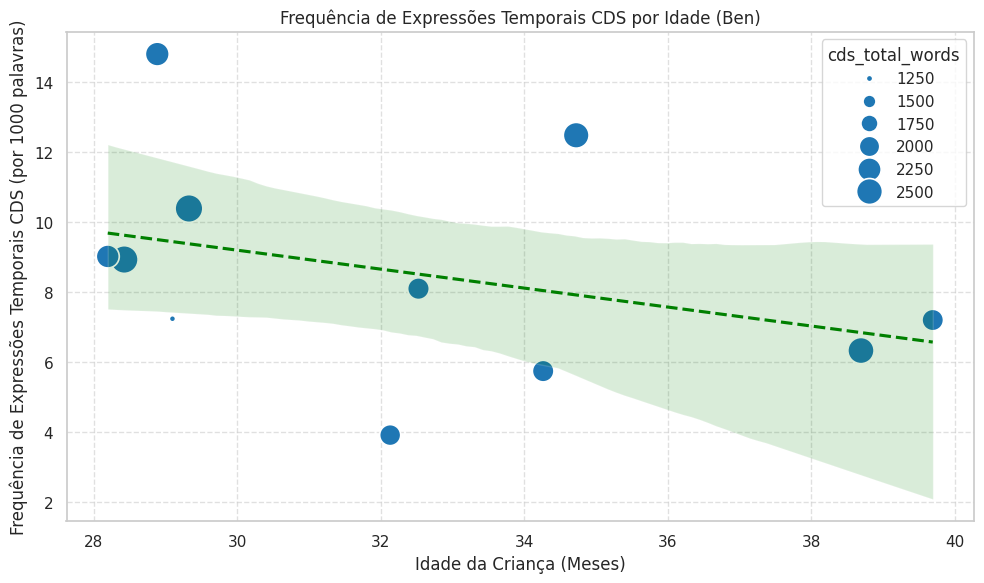

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


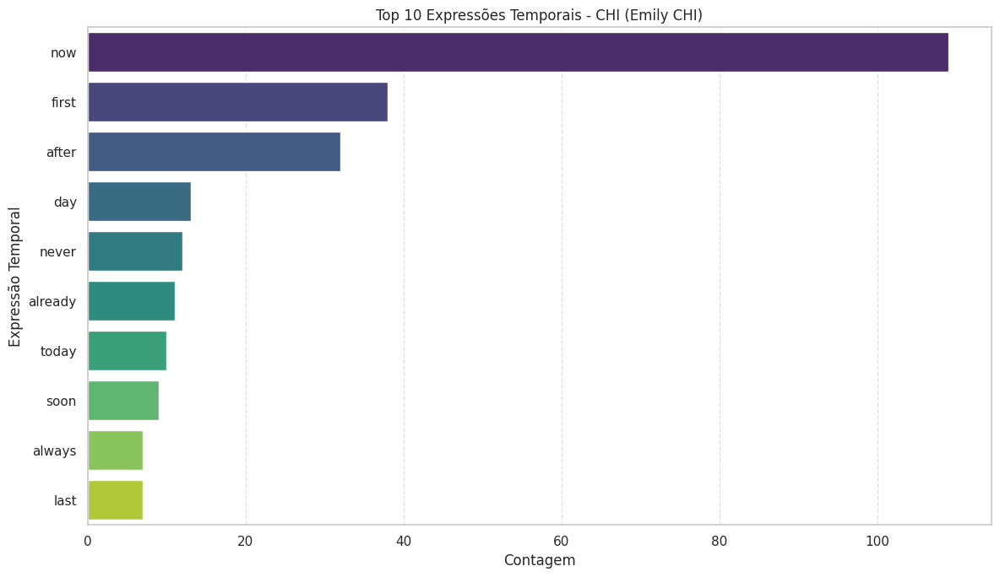

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


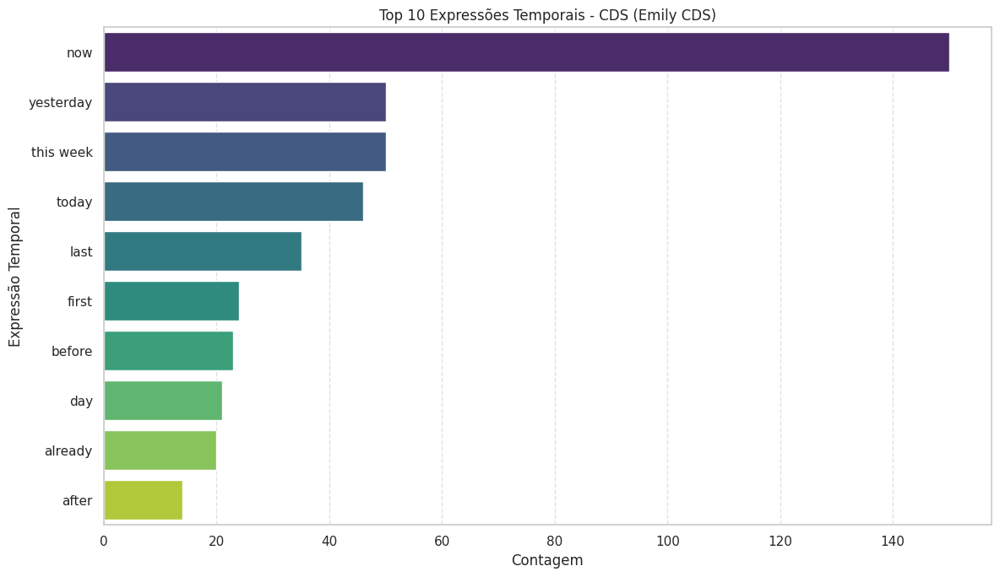

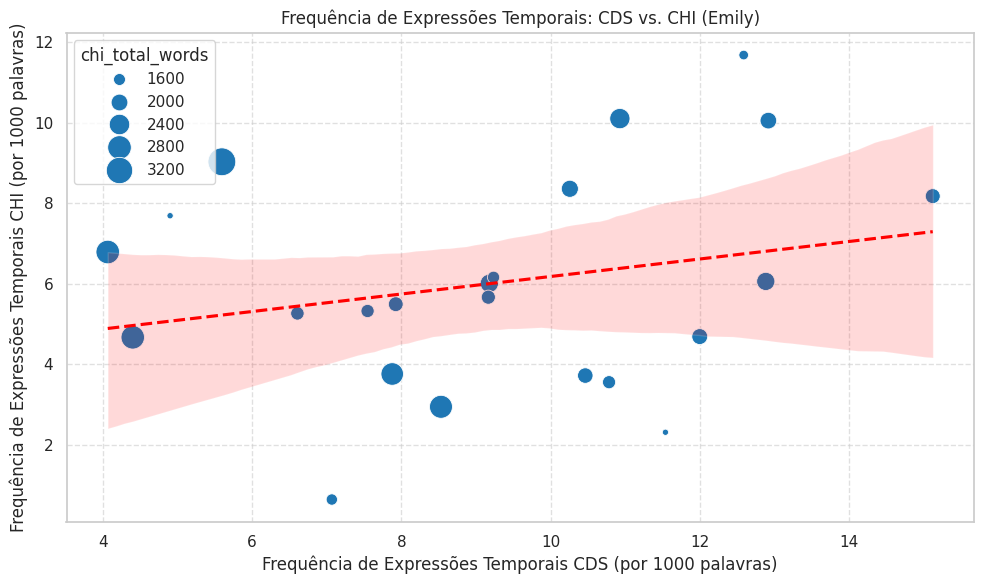

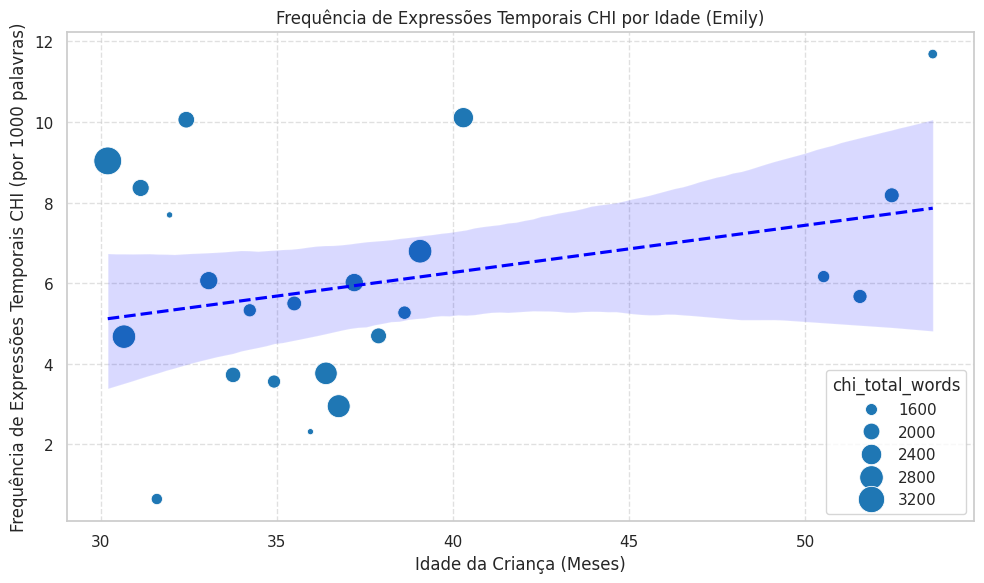

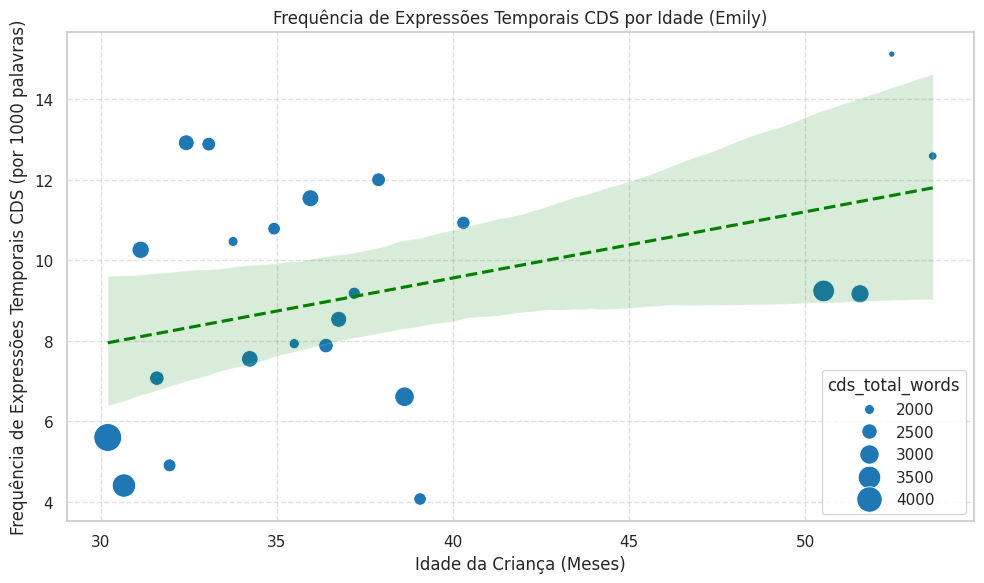

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


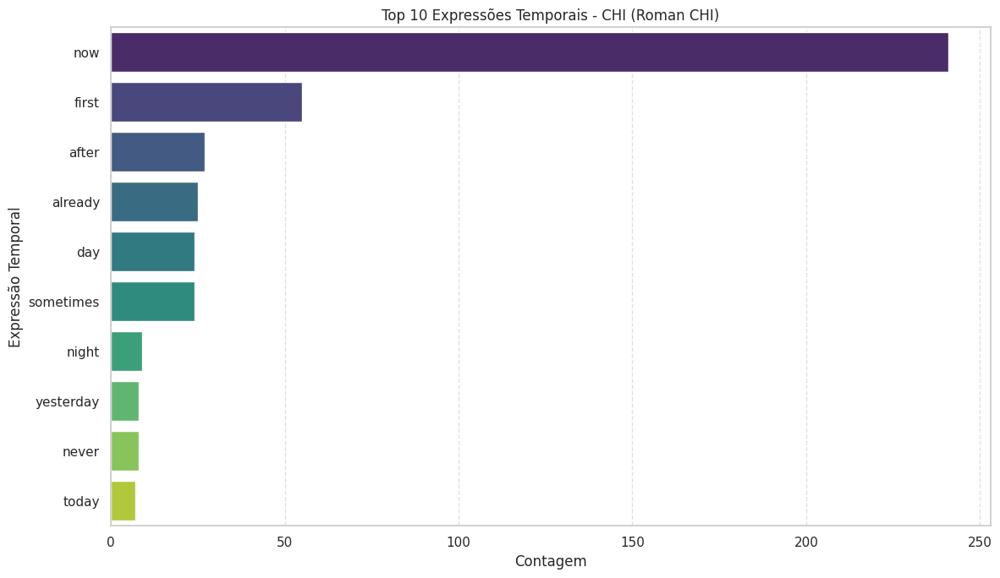

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


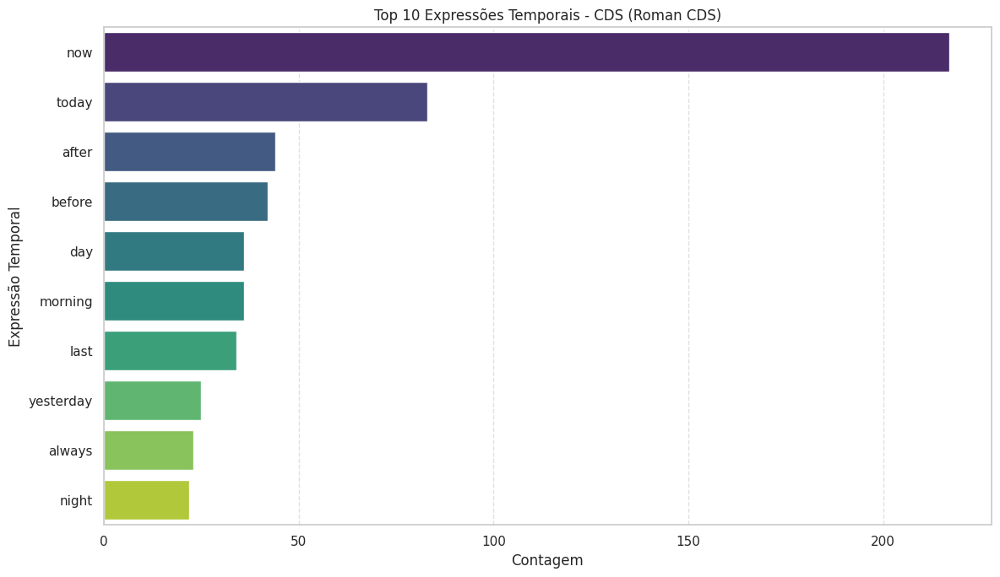

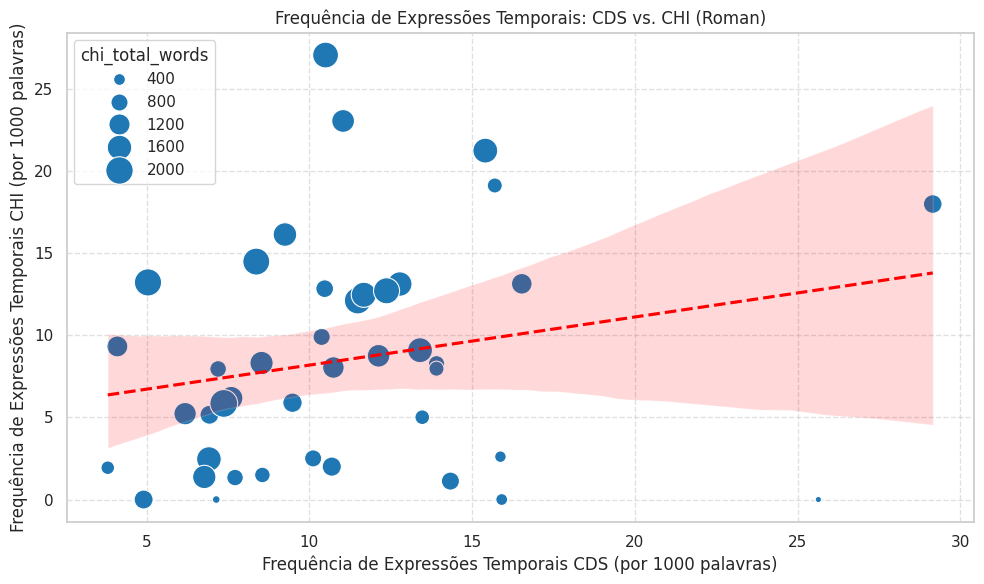

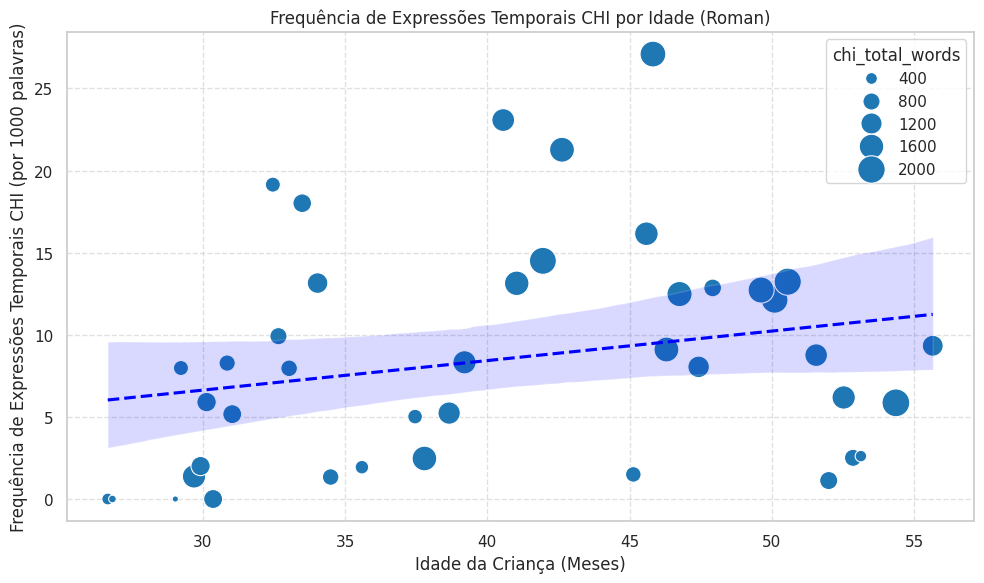

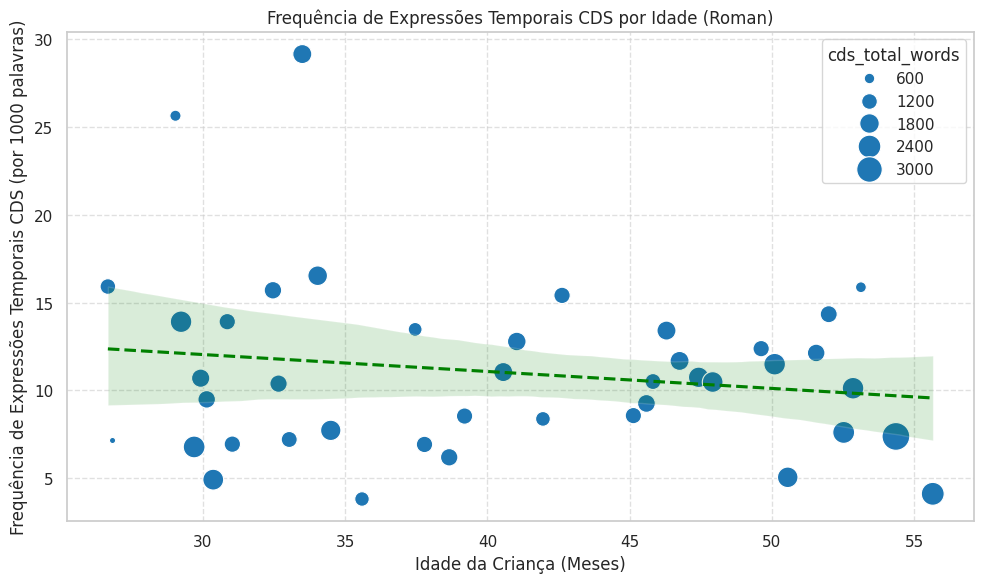

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


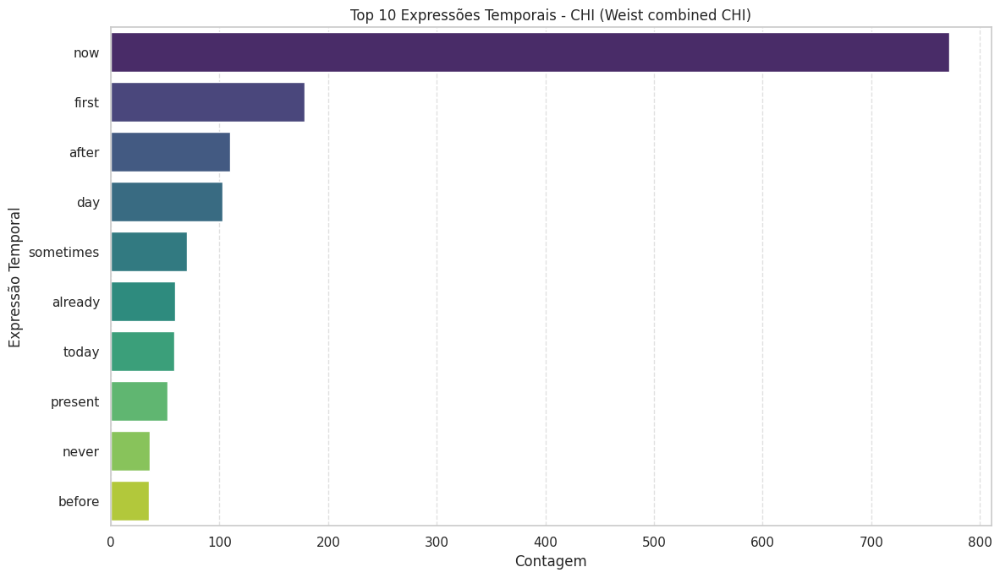

/tmp/ipython-input-42-693829390.py:393: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Contagem', y='Expressão', data=top_items_df, palette='viridis', orient='h') # Added orient='h'


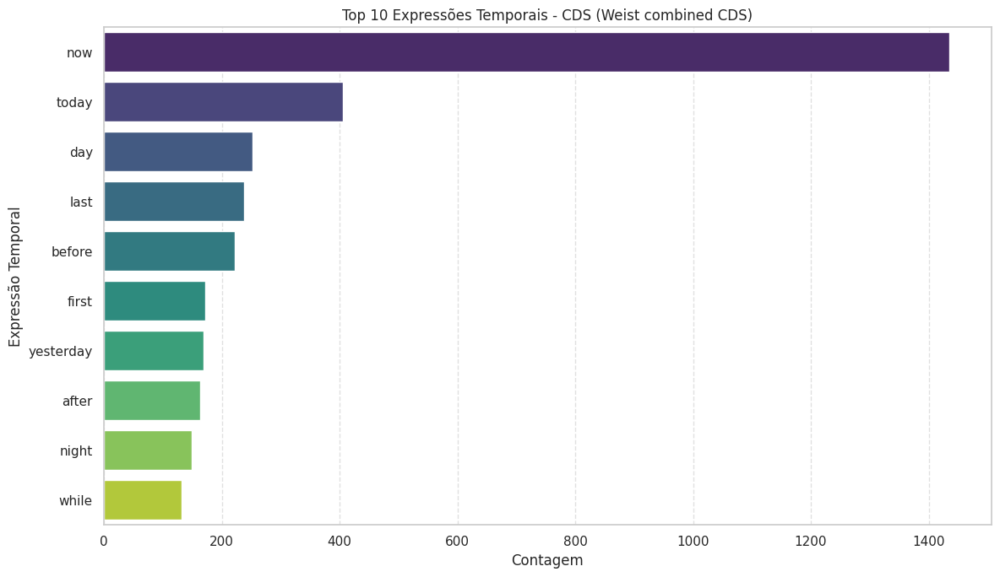

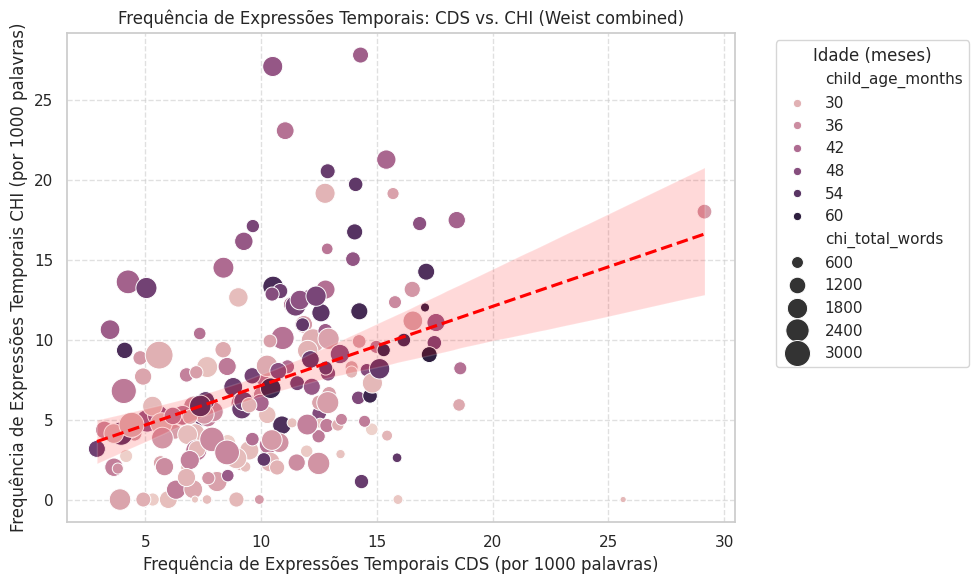

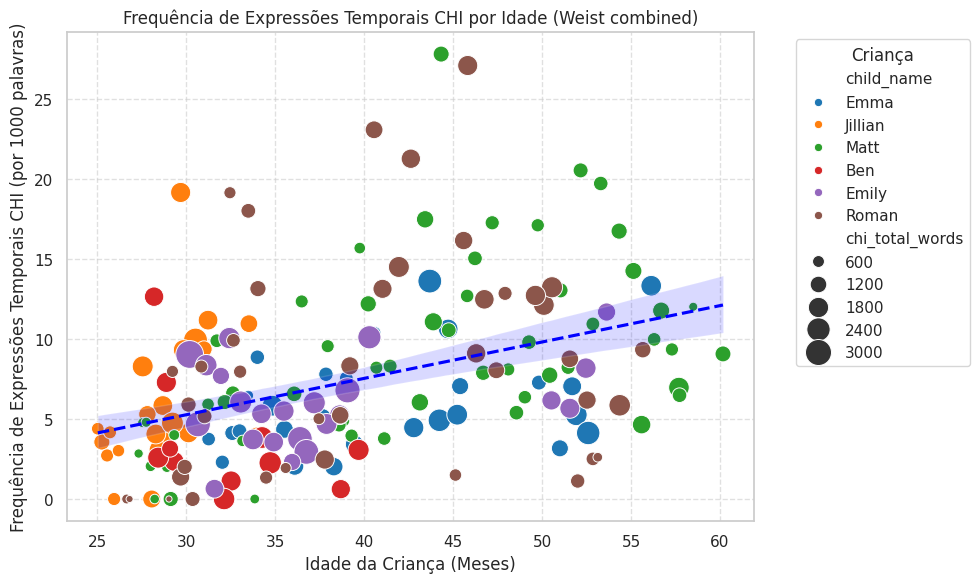

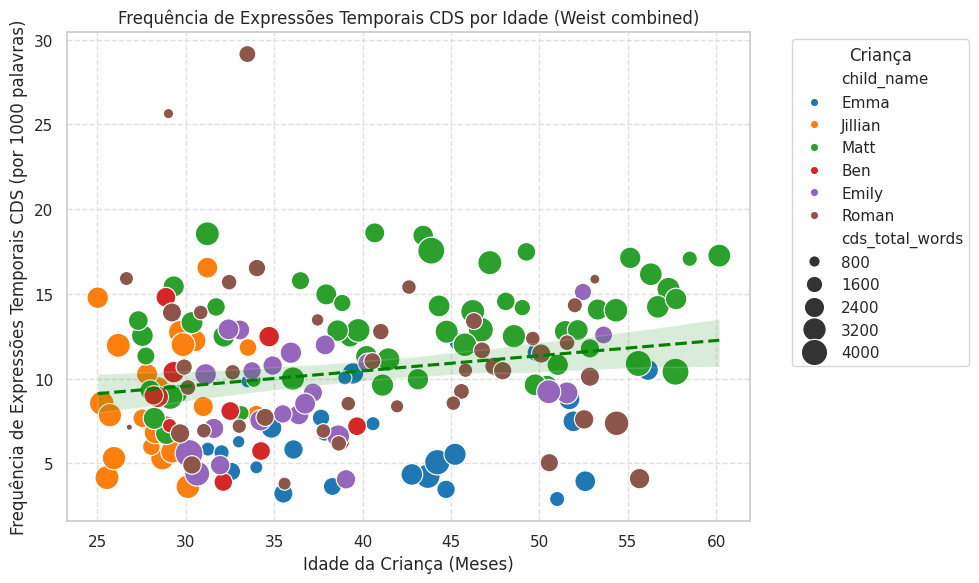

/tmp/ipython-input-42-693829390.py:707: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


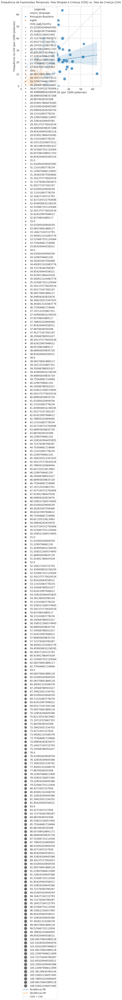

/tmp/ipython-input-42-693829390.py:732: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


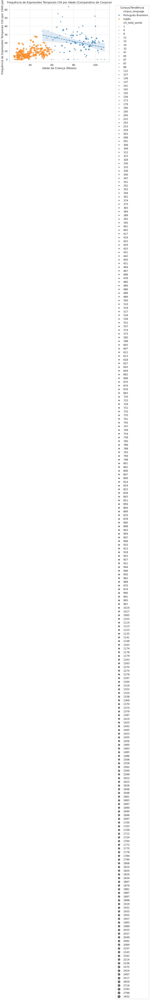

/tmp/ipython-input-42-693829390.py:757: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


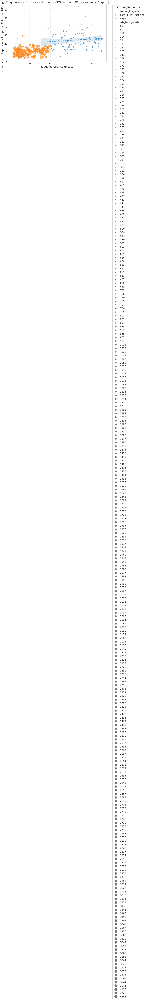

In [ ]:
# Executa a orquestração principal
if __name__ == "__main__":
    run_all_corpus_analyses()